<a href="https://colab.research.google.com/github/DorcasO/DorcasO/blob/main/Moringaseedoil.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os

#Define path inside your Google Drive
drive_path = "/content/drive/MyDrive/moringaseed_oil_location/"

# Extract the directory path
dir_path = os.path.dirname(drive_path)

# Create the directory if it doesn't exist
os.makedirs(dir_path, exist_ok=True)

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from mpl_toolkits.axes_grid1 import make_axes_locatable  # nice colour‑bars

plt.style.use("ggplot")
sns.set_context("talk")


In [3]:
ROOT = Path("/content/drive/MyDrive/moringaseed_oil_location/Moringa_Seed data_geolocation.xlsx/")

try:
    fames = pd.read_excel("/content/drive/MyDrive/moringaseed_oil_location  /FAMEs_means.xlsx")
    tocopherols = pd.read_excel("/content/drive/MyDrive/moringaseed_oil_location  /Tocopherols_means.xlsx")
    phytosterols = pd.read_excel("/content/drive/MyDrive/moringaseed_oil_location  /Phytosterols_means.xlsx")
    geo = pd.read_excel("/content/drive/MyDrive/moringaseed_oil_location  /Geolocations.xlsx")

    print("✓ Data loaded successfully!")
except Exception as e:
    print(f"‼ Data loading failed: {e}")


✓ Data loaded successfully!


In [4]:
#1. Merge chemical blocks + coordinates
dfs = [fames,tocopherols, phytosterols]
df  = dfs[0]
for d in dfs[1:]:
    df = df.merge(d, on="Samples", how="inner")

df = df.merge(geo, on="Samples", how="left")   # adds Latitude, Longitude, GeoLocation
print("Final shape:", df.shape)

Final shape: (45, 46)


In [5]:
#2. Quick glance
display(df.head())
display(df.describe(include="all").T)


,Samples,C14.0,C16.0,C16.1D9,C17.0,C18.0,C18.1D9,C18.1D11,C18.2,C18.3n3,...,Unknown1,Unknown2,D7.Stigmastenol,D7.Avenasterol,m.z_512,X24.Methyl.Cycloart,Citrostadienol,Latitude,Longitude,Geo.location
0,IMO9,1.513333,84.813333,18.133333,1.346667,80.093333,882.256667,65.763333,5.216667,1.490000,...,92.140000,92.140000,154.066667,123.230000,9.856667,48.463333,59.556667,31.488920,76.01406,India
1,KMO2,1.143333,83.676667,30.720000,1.490000,77.593333,888.203333,103.750000,11.070000,3.023333,...,69.010000,82.456667,155.473333,54.543333,9.986667,109.053333,81.023333,1.205038,36.88309,Kenya
2,KMO4,1.576667,73.860000,18.740000,1.713333,63.683333,932.836667,92.170000,7.343333,2.416667,...,117.926667,109.100000,136.493333,79.716667,15.460000,119.660000,68.753333,0.461796,34.09980,Kenya
3,KMO6,1.796667,89.236667,25.386667,1.390000,74.870000,943.650000,98.816667,7.163333,1.703333,...,68.173333,68.173333,103.590000,42.233333,3.600000,60.650000,40.650000,-1.292200,36.82278,Kenya
4,KMO7,1.743333,84.786667,23.460000,1.440000,58.226667,971.636667,111.920000,9.356667,1.900000,...,79.523333,79.523333,68.446667,37.800000,6.756667,52.026667,31.480000,-2.181160,40.81910,Kenya


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Samples,45,45,IMO9,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
C14.0,45.0,NaN,NaN,NaN,1.241519,0.236153,0.913333,1.073333,1.186667,1.396667,1.813333
C16.0,45.0,NaN,NaN,NaN,82.971148,11.907014,52.67,77.11,84.406667,87.756667,135.445
C16.1D9,45.0,NaN,NaN,NaN,18.970889,6.932194,1.973333,16.83,18.983333,23.526667,34.49
C17.0,45.0,NaN,NaN,NaN,1.331296,0.20094,0.446667,1.293333,1.34,1.43,1.713333
C18.0,45.0,NaN,NaN,NaN,75.33037,15.08961,53.243333,63.6,74.87,83.58,112.66
C18.1D9,45.0,NaN,NaN,NaN,880.638185,65.932577,602.693333,853.673333,882.48,925.146667,971.636667
C18.1D11,45.0,NaN,NaN,NaN,69.504704,23.819228,7.113333,63.606667,73.146667,80.956667,111.92
C18.2,45.0,NaN,NaN,NaN,7.995889,1.379964,5.216667,7.27,8.103333,8.643333,12.115
C18.3n3,45.0,NaN,NaN,NaN,2.057185,0.818228,0.0,1.756667,2.11,2.416667,3.97


In [6]:
#3. Variable groups
headline_fa = ["C14.0", "C16.0", "C16.1D9"]

NUM_BLOCKS = {
    "FAMEs":         headline_fa +
                     [c for c in fames.columns
                      if c not in ("SampleID",) + tuple(headline_fa)],
    "Tocopherols":   [c for c in tocopherols.columns if c != "Samples"],
    "Phytosterols":  [c for c in phytosterols.columns if c != "Samples"],
}


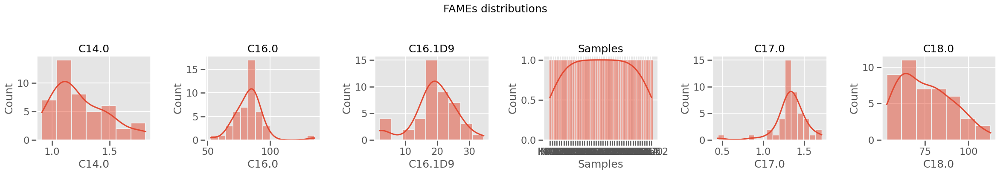

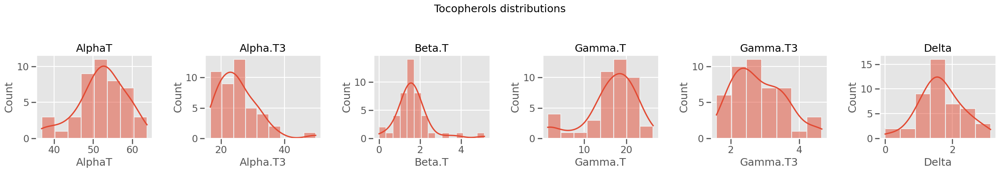

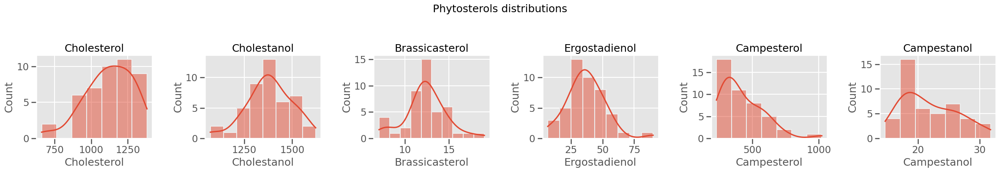

In [7]:
#4.Distributions
def hist_grid(cols, title):
    n = len(cols)
    fig, axes = plt.subplots(1, n, figsize=(4*n, 4))
    for ax, col in zip(axes, cols):
        sns.histplot(df[col], kde=True, ax=ax)
        ax.set_title(col)
    fig.suptitle(title, y=1.04, fontsize=18)
    plt.tight_layout()

for block, cols in NUM_BLOCKS.items():
    hist_grid(cols[:min(6, len(cols))], f"{block} distributions")



In [ ]:
save_fig(sns.distributions)

In [9]:
import os
import matplotlib.pyplot as plt
from pathlib import Path

# Define where to save figures
SAVE_DIR = Path("/content/drive/MyDrive/moringaseed_oil_location/figures")
#SAVE_DIR.mkdir(parents=True, exist_ok=True)  # create if not exists

def save_fig(name, dpi=300):
    """Save current Matplotlib figure to Google Drive"""
    path = SAVE_DIR / f"{name}.png"
    plt.savefig(path, dpi=dpi, bbox_inches='tight')
    print(f"✓ Saved: {path}")


In [10]:
#4.Distributions
def hist_grid(cols, title):
    n = len(cols)
    fig, axes = plt.subplots(1, n, figsize=(4*n, 4))
    for ax, col in zip(axes, cols):
        sns.histplot(df[col], kde=True, ax=ax)
        ax.set_title(col)
    fig.suptitle(title, y=1.04, fontsize=18)
    plt.tight_layout()
    return fig # Return the figure object

for block, cols in NUM_BLOCKS.items():
    fig = hist_grid(cols[:min(20, len(cols))], f"{block} distributions") # Capture the figure object
    # Save each distribution plot
    save_fig(f"Distributions_{block}")
    plt.close(fig) # Close the figure after saving to free memory

✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/Distributions_FAMEs.png
✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/Distributions_Tocopherols.png
✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/Distributions_Phytosterols.png


In [45]:
# The plot_component_heatmap function definition has been moved to a separate cell for better organization.
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# def plot_component_heatmap(df_component, geo, title, filename):
#     # Merge component data with geolocation
#     df = pd.merge(df_component, geo, on="Samples")

#     # Set Samples as index and sort by Geo.location (optional)
#     df.set_index("Samples", inplace=True)
#     df = df.sort_values(by="Geo.location")  # Optional for regional clarity

#     # Extract only chemical columns
#     compound_cols = [col for col in df.columns if col not in ["Samples", "Latitude", "Longitude", "Geo.location"]]

#     # Normalize (optional, for clearer heatmap scaling)
#     data_normalized = (df[compound_cols] - df[compound_cols].min()) / (df[compound_cols].max() - df[compound_cols].min())

#     # Plot heatmap
#     plt.figure(figsize=(14, 12)) # Increased figure height
#     sns.heatmap(data_normalized, cmap="YlGnBu", cbar_kws={'label': 'Normalized Concentration'})
#     plt.title(title, fontsize=14)
#     plt.xlabel("Compound")
#     plt.ylabel("Samples / Geo.location")
#     plt.tight_layout()
#     save_fig(filename)
#     # plt.close() # Removed this line to display the plot

In [57]:
# The calls to plot_component_heatmap have been moved to a new cell to ensure correct execution order.
# plot_component_heatmap(fames, geo, "FAME Profiles by Location", "heatmap_fames")
# plot_component_heatmap(tocopherols, geo, "Tocopherol Profiles by Location", "heatmap_tocopherols")
# plot_component_heatmap(phytosterols, geo, "Phytosterol Profiles by Location", "heatmap_phytosterols")
# plt.savefig(f"/content/drive/MyDrive/moringaseed_oil_location/figures/{"/content/drive/MyDrive/moringaseed_oil_location/figures"}.png", dpi=500, bbox_inches='tight')
# plt.show()
# plt.close()

In [31]:
def plot_component_heatmap(df_component, geolocations, title, filename):
    df = pd.merge(df_component, geolocations, on="SampleID")
    df.set_index("SampleID", inplace=True)
    df = df.sort_values("GeoLocation")
    chem_cols = [col for col in df.columns if col not in ["Latitude", "Longitude", "GeoLocation"]]
    data_normalized = (df[chem_cols] - df[chem_cols].min()) / (df[chem_cols].max() - df[chem_cols].min())

    plt.figure(figsize=(14, 8))
    sns.heatmap(data_normalized, cmap="YlGnBu", cbar_kws={'label': 'Normalized Concentration'})
    plt.title(title, fontsize=16)
    plt.xlabel("Compound")
    plt.ylabel("SampleID / GeoLocation")
    plt.tight_layout()

    # Save and display
    plt.savefig(f"/content/drive/MyDrive/moringaseed_oil_location/figures/{filename}.png", dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


In [24]:
# This cell is no longer needed as the plotting code is now in the plot_component_heatmap function.
# Extract only chemical columns
# compound_cols = [col for col in df.columns if col not in ["Samples", "Latitude", "Longitude", "Geo.location"]]

# Normalize (optional, for clearer heatmap scaling)
# data_normalized = (df[compound_cols] - df[compound_cols].min()) / (df[compound_cols].max() - df[compound_cols].min())

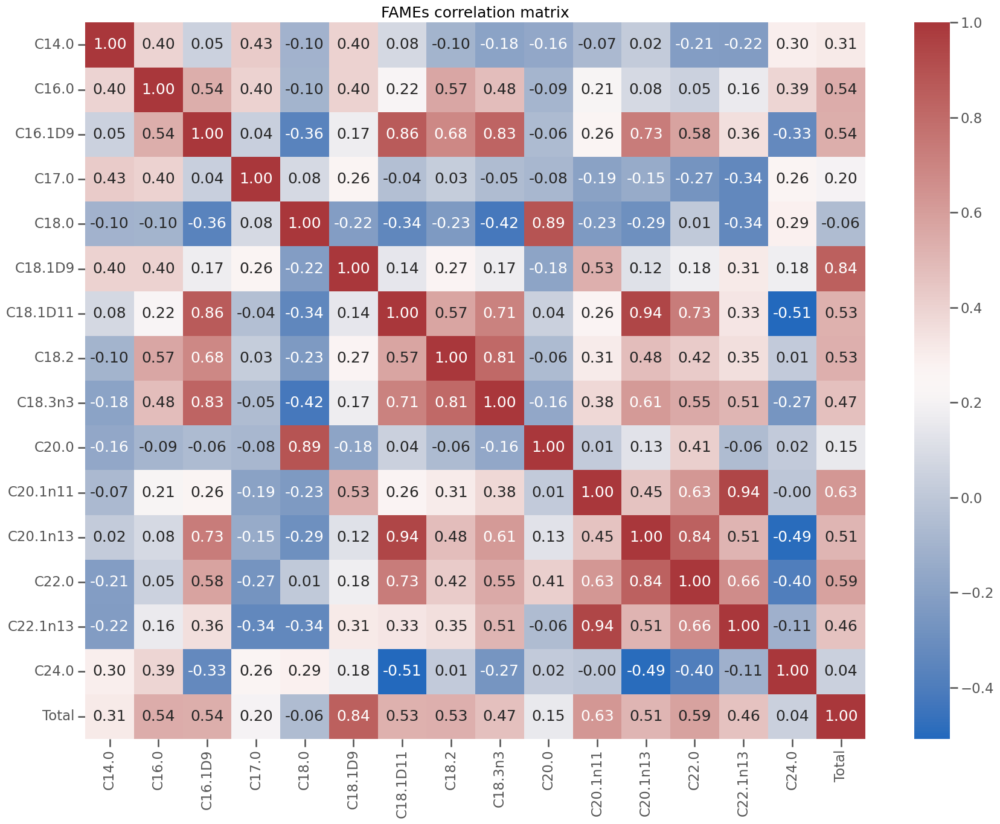

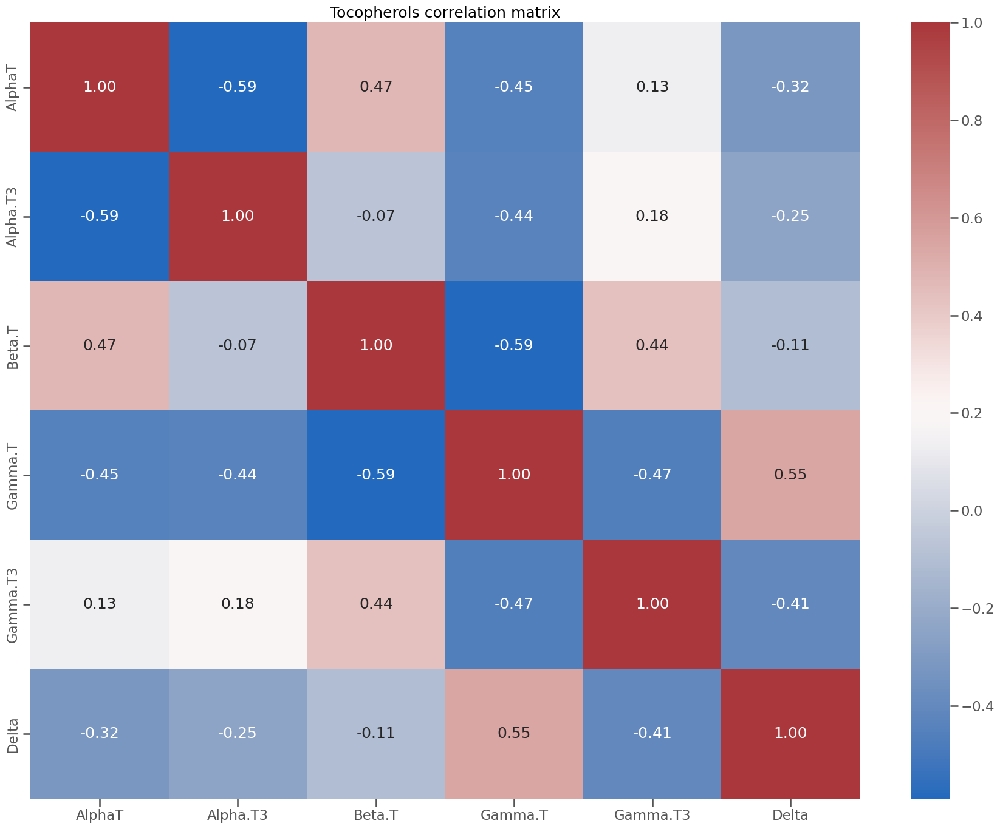

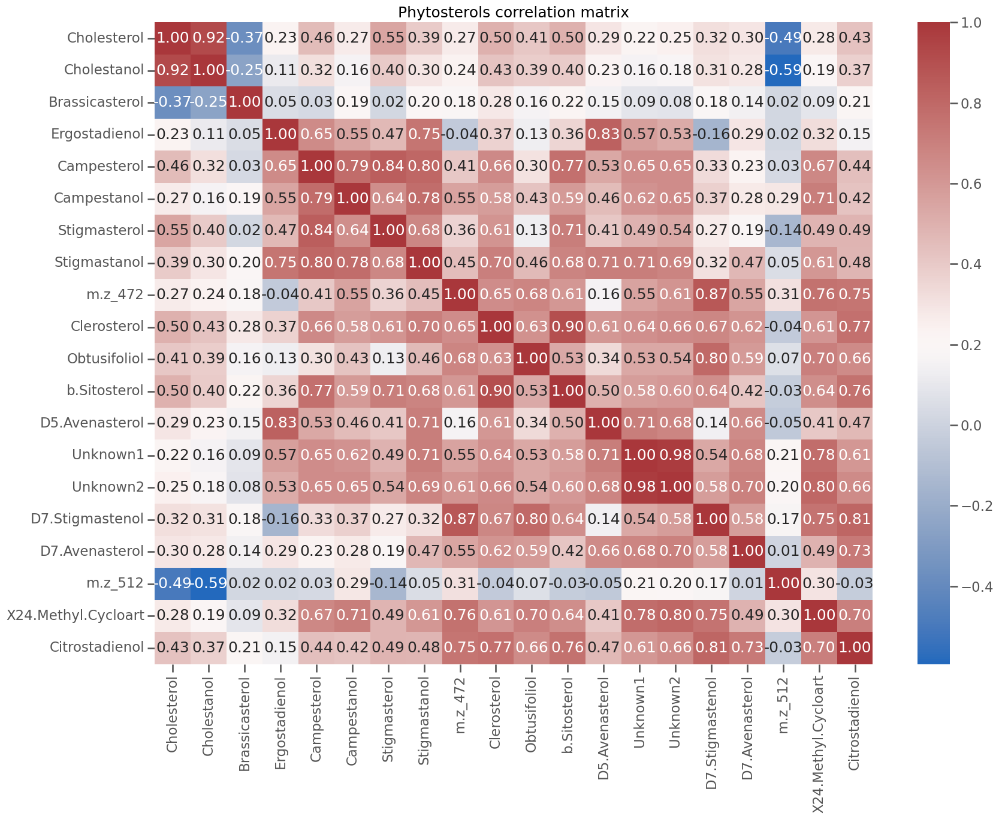

In [47]:
 #5. Correlation heat maps

for block, cols in NUM_BLOCKS.items():
    plt.figure(figsize=(18,14))
    # Exclude non-numeric columns like 'Samples' from correlation calculation
    numeric_cols = df[cols].select_dtypes(include=np.number).columns.tolist()
    sns.heatmap(df[numeric_cols].corr(), cmap="vlag", annot=True, fmt=".2f")
    plt.title(f"{block} correlation matrix")
    plt.tight_layout()

              C14.0  C16.0  C16.1D9
Geo.location                       
India          1.51  84.81    18.13
Kenya          1.49  81.62    13.46
Kwara IG       1.43  86.64    18.88
Philippines    1.36  75.78    19.10
Osun NIG       1.29  86.24    23.33
Mali           1.28  86.22    21.04
Ekiti NIG      1.20  87.63    22.86
Kwara NIG      1.19  80.07    18.58
KatsinaNIG     1.15  80.03    17.66
Oyo NIG        1.14  82.36    18.84
PlateauNIG     1.10  87.80    22.31
Burkina Faso   1.00  84.52    18.48
Ogun NIG       0.93  68.22    20.04


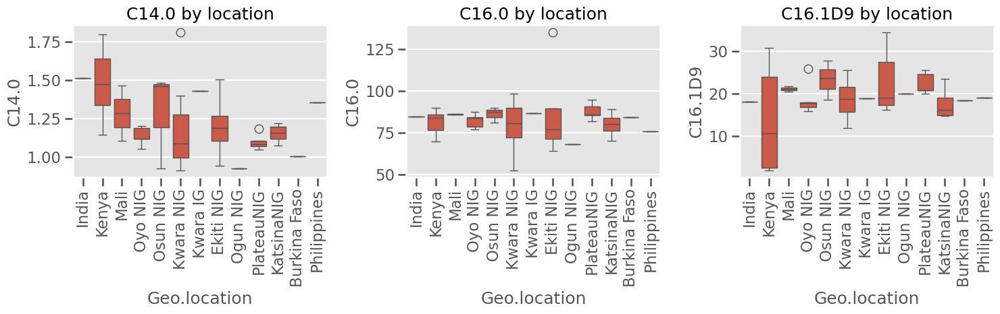

In [ ]:
#6. Geography effect (box‑plots) -----------------------------------

plt.figure(figsize=(15,5))
for i, col in enumerate(headline_fa, 1):
    plt.subplot(1,3,i)
    sns.boxplot(data=df, x="Geo.location", y=col)
    plt.xticks(rotation=90)
    plt.title(f"{col} by location")
plt.tight_layout()

regional_means = df.groupby("Geo.location")[headline_fa].mean().sort_values("C14.0", ascending=False)
print(regional_means.round(2))

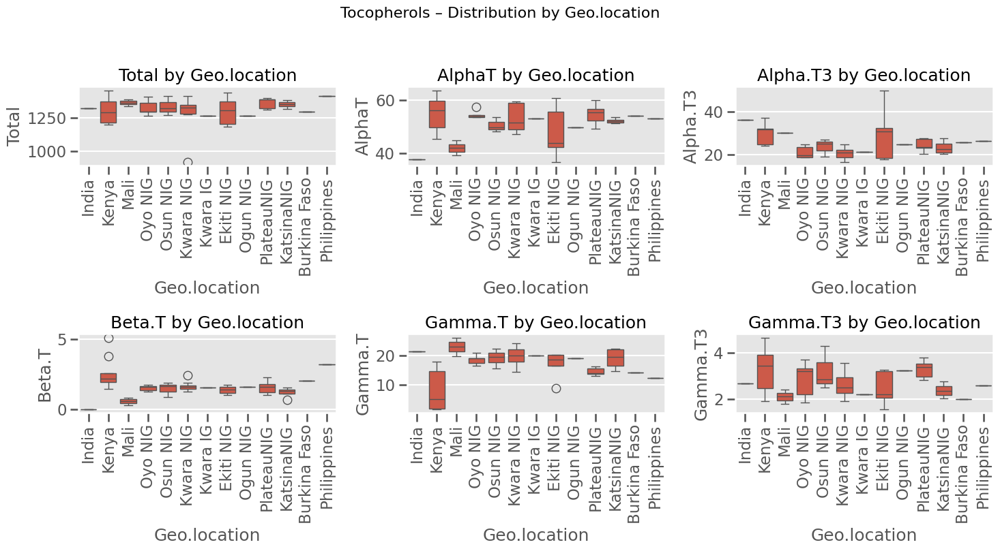

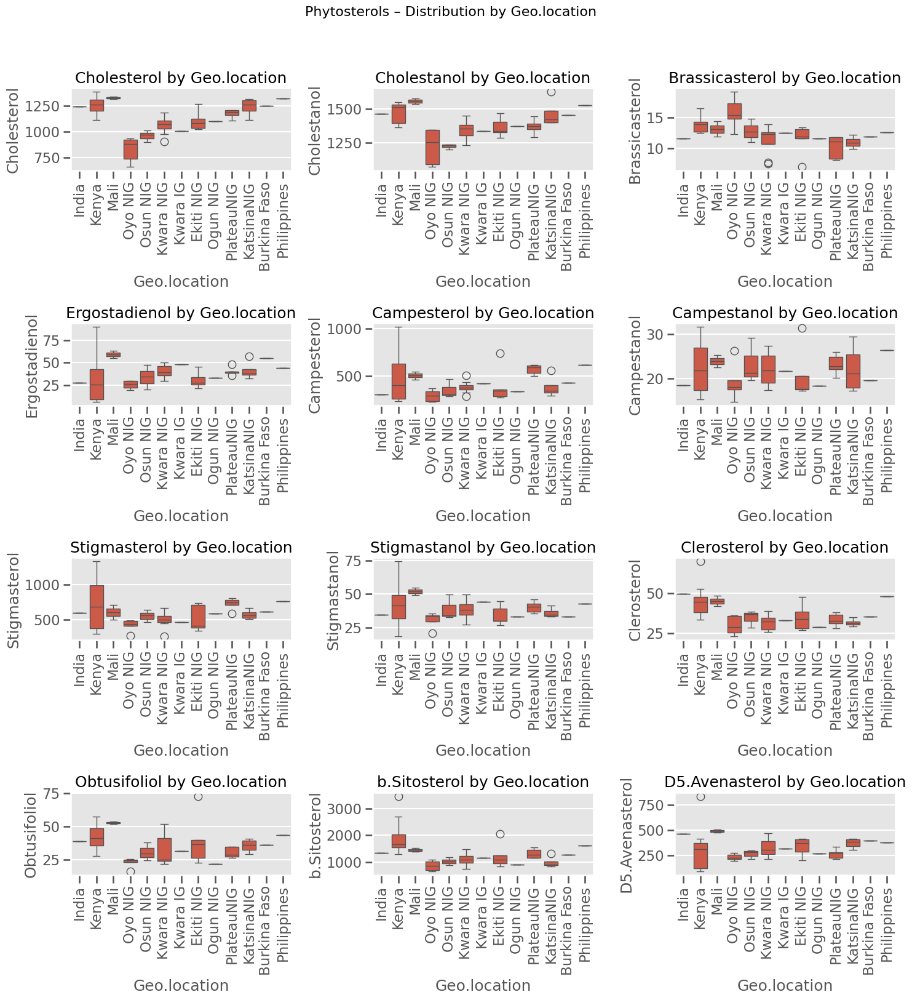

In [50]:
import math
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------------------------------------
# Define compound groups
# ---------------------------------------------------
FAMEs_cols = [col for col in df.columns if col.startswith("C")]
Tocopherol_cols = [col for col in df.columns if "Toc" in col or "T" in col or "Tocopherol" in col]
Phytosterol_cols = [col for col in df.columns if col.lower() in [ 'cholesterol', 'cholestanol', 'brassicasterol', 'ergostadienol', 'campesterol', 'campestanol', 'stigmasterol', 'stigmastanol', 'clerosterol', 'obtusifoliol','β‑sitosterol','b.sitosterol', 'd5.avenasterol', 'X24.Methyl.Cycloart', 'Citrostadienol']]

def plot_boxplots_by_location(dataframe, compound_cols, compound_type):
    n = len(compound_cols)
    ncols = 3
    nrows = math.ceil(n / ncols)

    plt.figure(figsize=(5 * ncols, 4 * nrows))
    for i, col in enumerate(compound_cols, 1):
        plt.subplot(nrows, ncols, i)
        sns.boxplot(data=dataframe, x="Geo.location", y=col)
        plt.xticks(rotation=90)
        plt.title(f"{col} by Geo.location")
        plt.tight_layout()

    plt.suptitle(f"{compound_type} – Distribution by Geo.location", y=1.02, fontsize=16)
    plt.tight_layout()
    plt.savefig(f"/content/drive/MyDrive/moringaseed_oil_location/figures/boxplot_{compound_type}.png", dpi=300)
    plt.show()
    plt.close()

# ---------------------------------------------------
# Run for each chemical class
# ---------------------------------------------------
#plot_boxplots_by_location(df, FAMEs_cols, "FAMEs")
plot_boxplots_by_location(df, Tocopherol_cols, "Tocopherols")
plot_boxplots_by_location(df, Phytosterol_cols, "Phytosterols")


In [63]:
def plot_individual_boxplots(df, compound_cols, compound_type):
    output_dir = f"/content/drive/MyDrive/moringaseed_oil_location/figures/{compound_type}"
    os.makedirs(output_dir, exist_ok=True)

    for col in compound_cols:
        plt.figure(figsize=(10, 5))
        sns.boxplot(data=df, x="Geo.location", y=col)
        plt.xticks(rotation=90)
        plt.title(f"{compound_type} – {col} by Geo.location")
        plt.tight_layout()
        plt.savefig(f"{output_dir}/{col}_boxplot.png", dpi=300)
        plt.show()
        plt.close()
        print(f"✅ Saved: {col}_boxplot.png")
        plt.show()
        plt.close()


In [64]:
def plot_grouped_violin_or_box(df, compound_cols, compound_type, plot_type="violin"):
    n = len(compound_cols)
    ncols = 3
    nrows = math.ceil(n / ncols)

    plt.figure(figsize=(5 * ncols, 4 * nrows))
    for i, col in enumerate(compound_cols, 1):
        plt.subplot(nrows, ncols, i)
        if plot_type == "violin":
            sns.violinplot(data=df, x="Geo.location", y=col, inner="box")
        else:
            sns.boxplot(data=df, x="Geo.location", y=col)
        plt.xticks(rotation=90)
        plt.title(f"{col}")

    plt.suptitle(f"{compound_type} ({plot_type.capitalize()} Plots) by Geo.location", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.savefig(f"/content/drive/MyDrive/moringaseed_oil_location/figures/{compound_type}_{plot_type}_grouped.png", dpi=300)
    plt.show()
    plt.close()


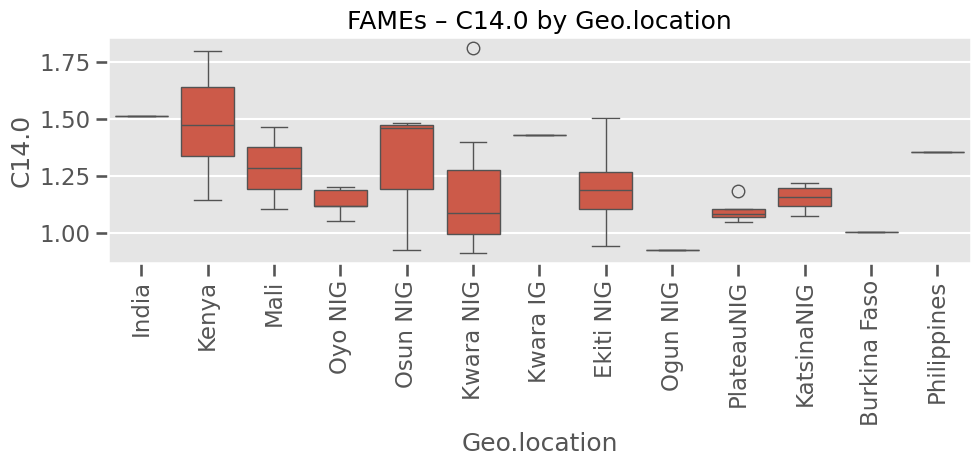

✅ Saved: C14.0_boxplot.png


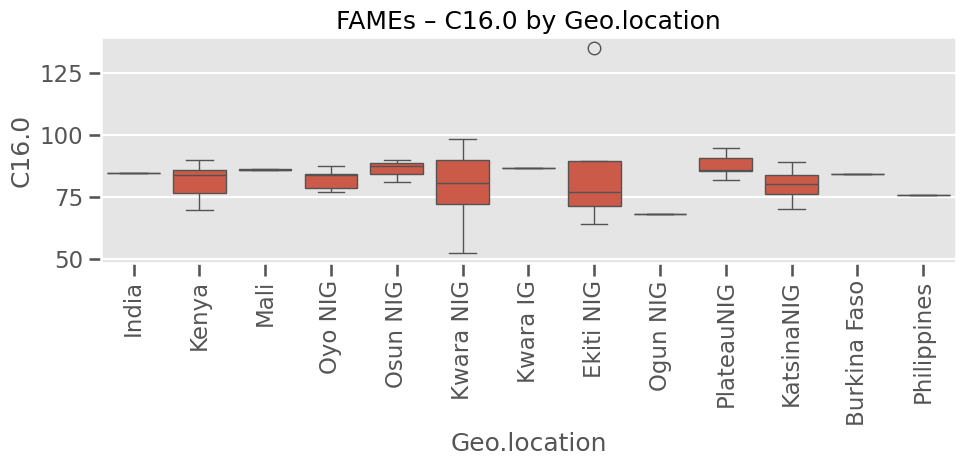

✅ Saved: C16.0_boxplot.png


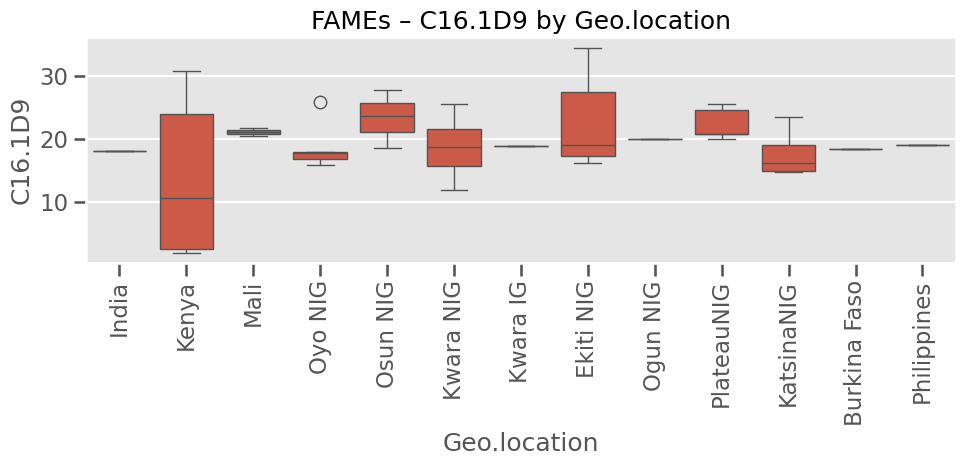

✅ Saved: C16.1D9_boxplot.png


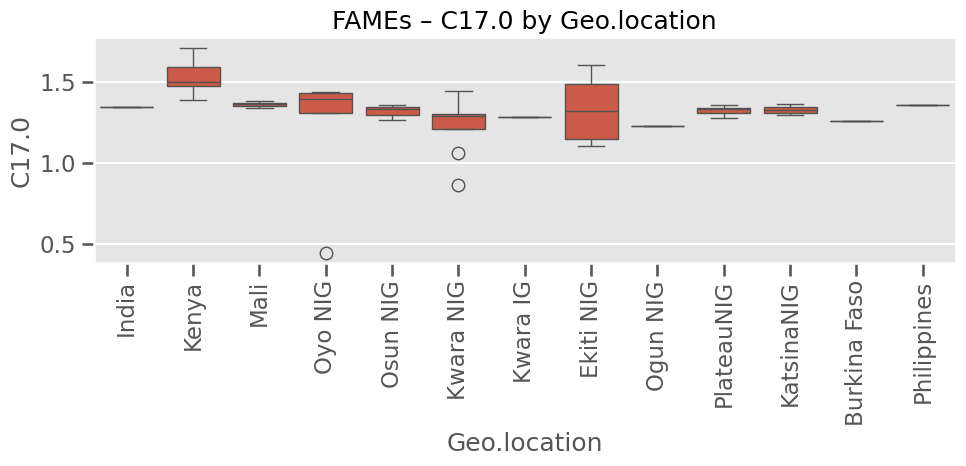

✅ Saved: C17.0_boxplot.png


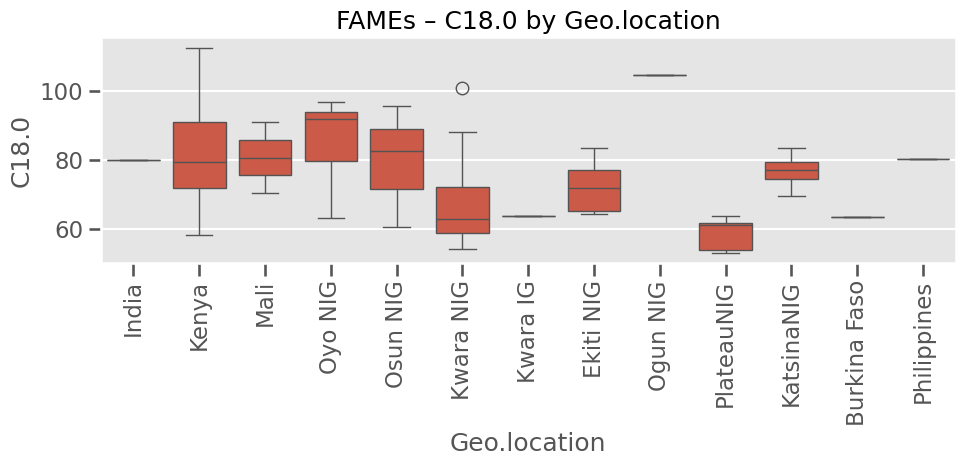

✅ Saved: C18.0_boxplot.png


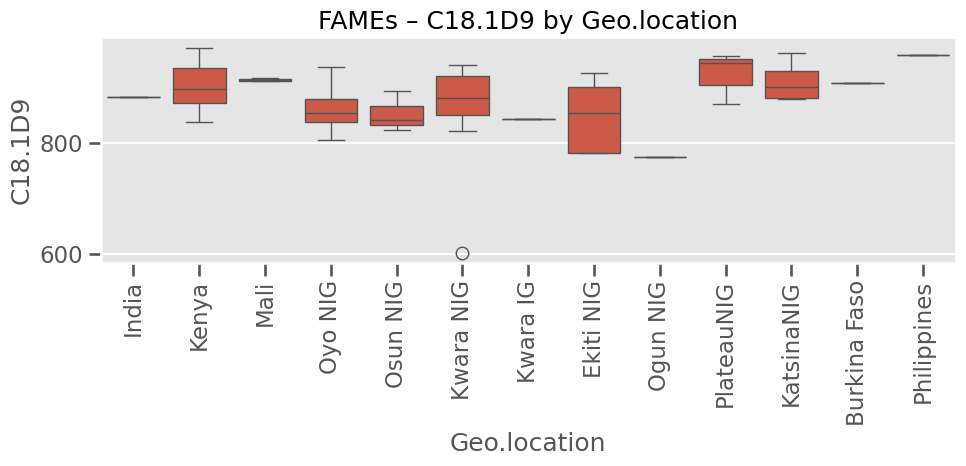

✅ Saved: C18.1D9_boxplot.png


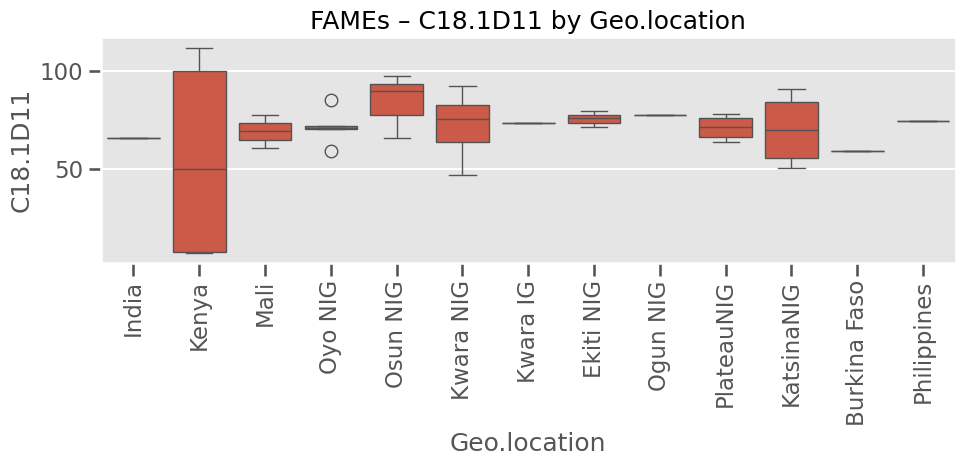

✅ Saved: C18.1D11_boxplot.png


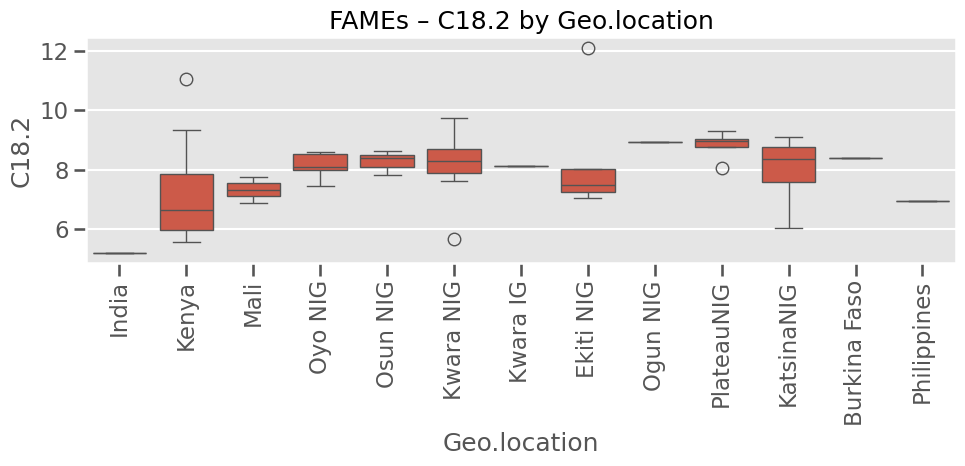

✅ Saved: C18.2_boxplot.png


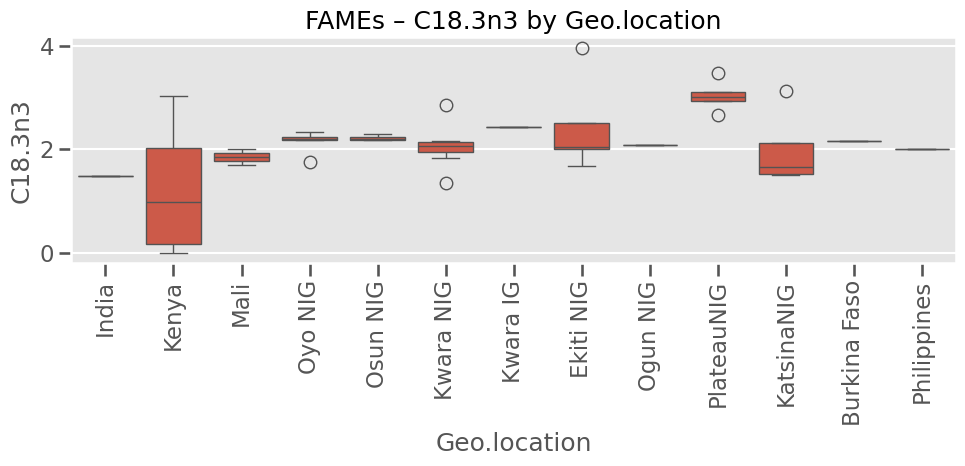

✅ Saved: C18.3n3_boxplot.png


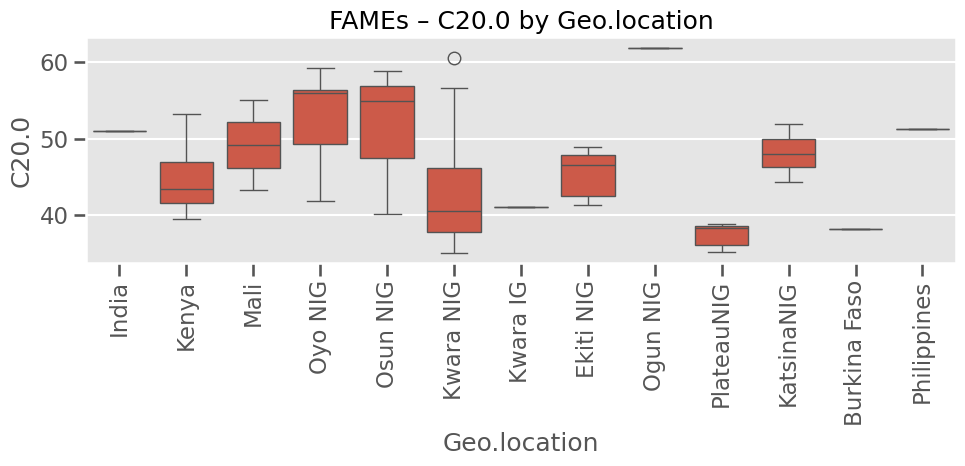

✅ Saved: C20.0_boxplot.png


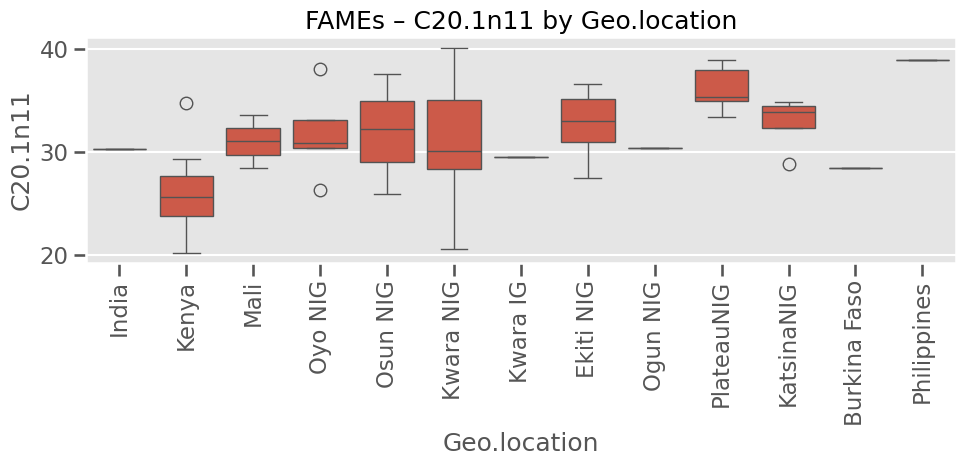

✅ Saved: C20.1n11_boxplot.png


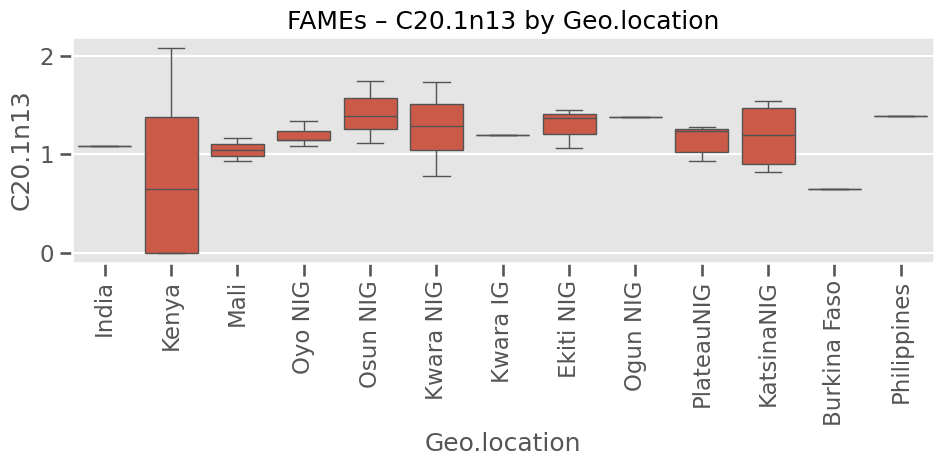

✅ Saved: C20.1n13_boxplot.png


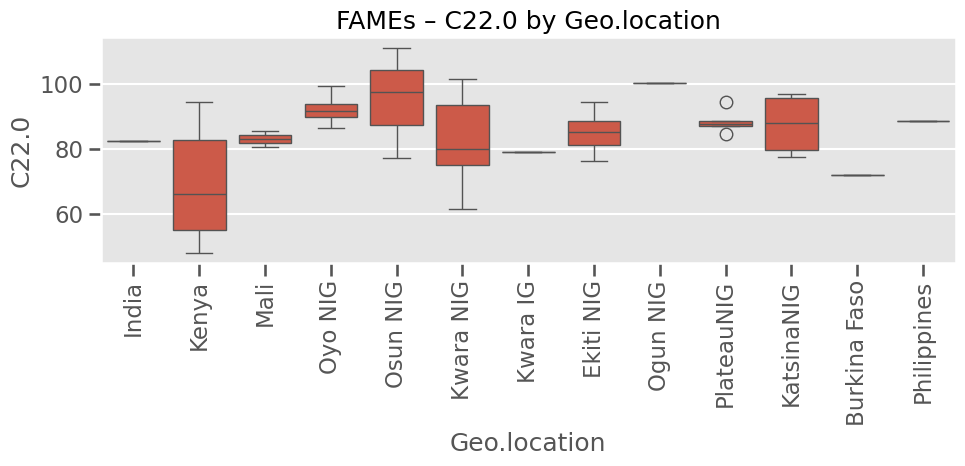

✅ Saved: C22.0_boxplot.png


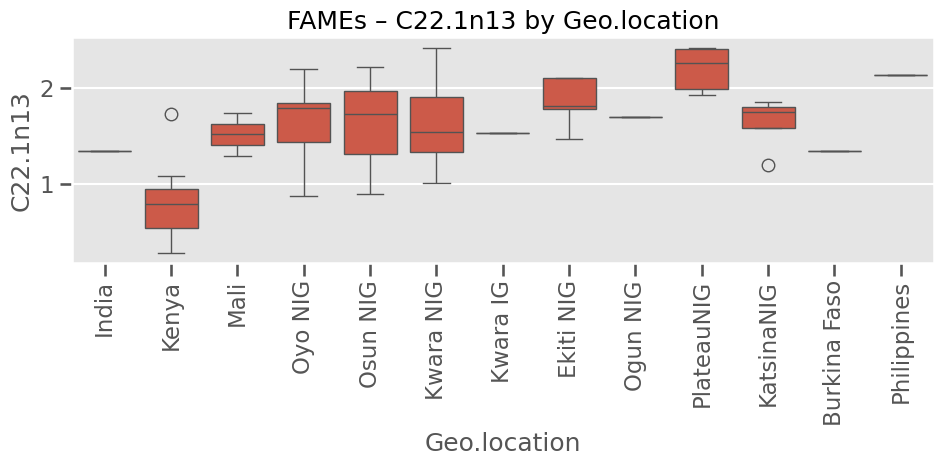

✅ Saved: C22.1n13_boxplot.png


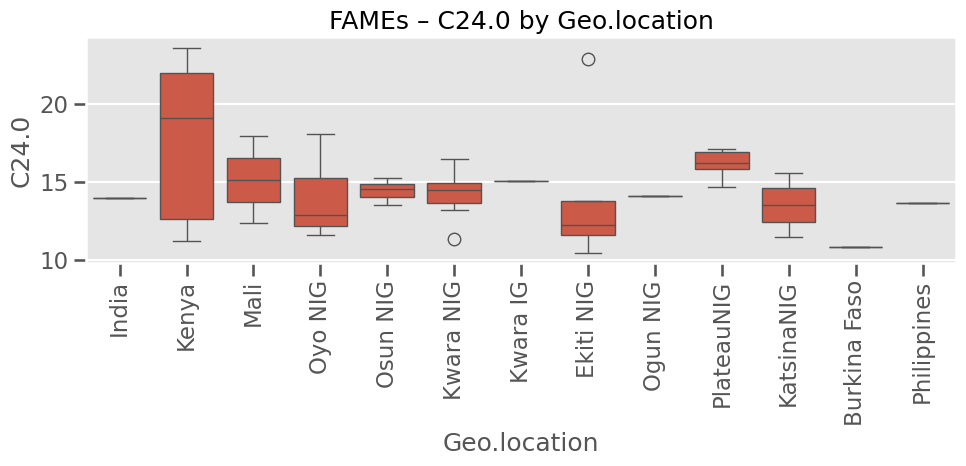

✅ Saved: C24.0_boxplot.png


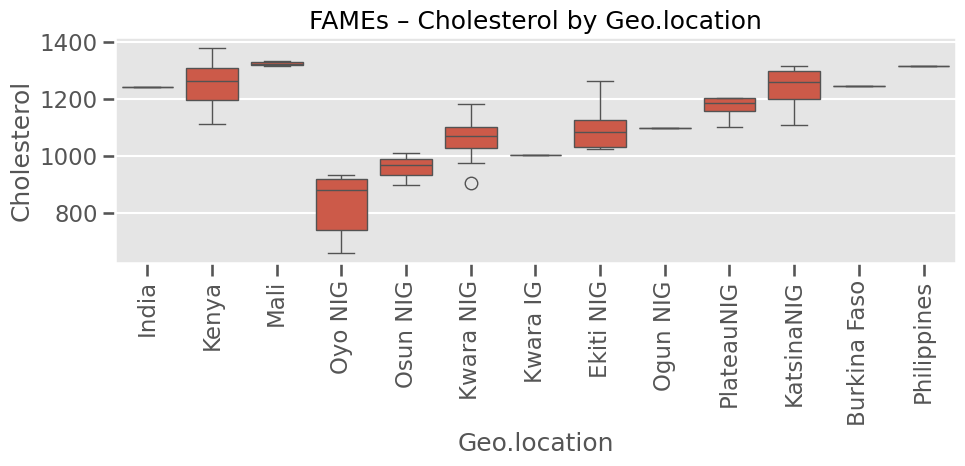

✅ Saved: Cholesterol_boxplot.png


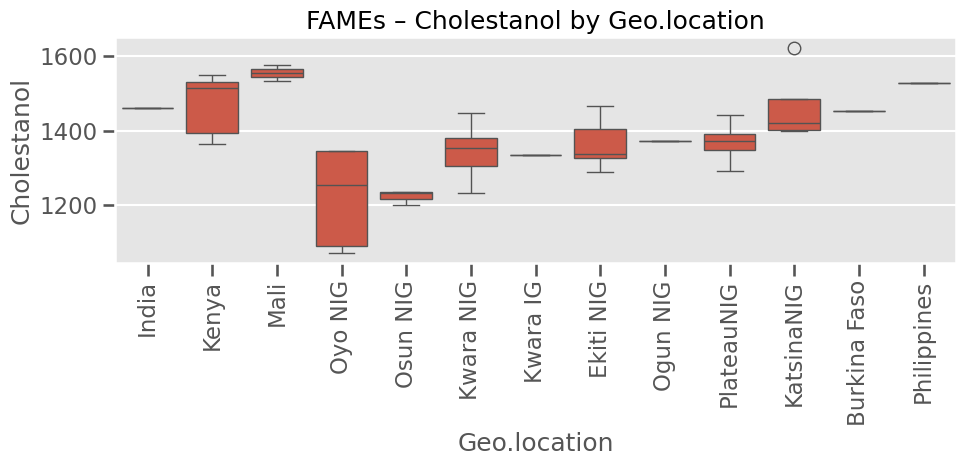

✅ Saved: Cholestanol_boxplot.png


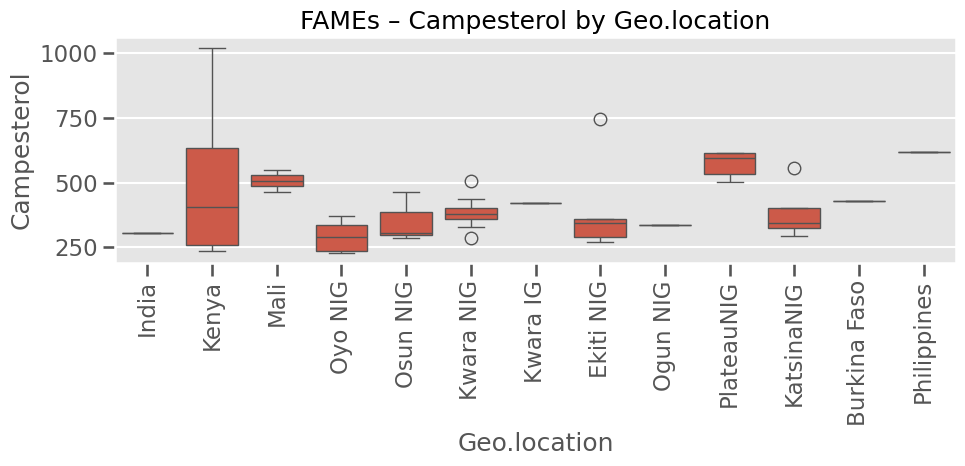

✅ Saved: Campesterol_boxplot.png


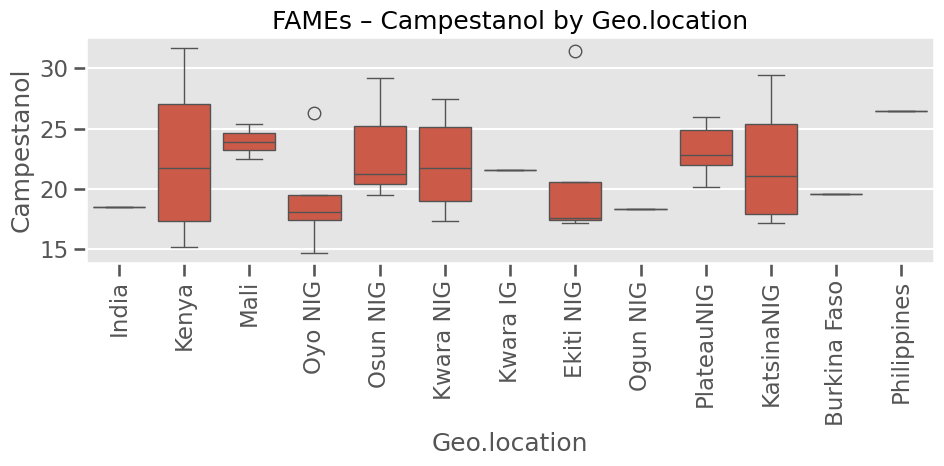

✅ Saved: Campestanol_boxplot.png


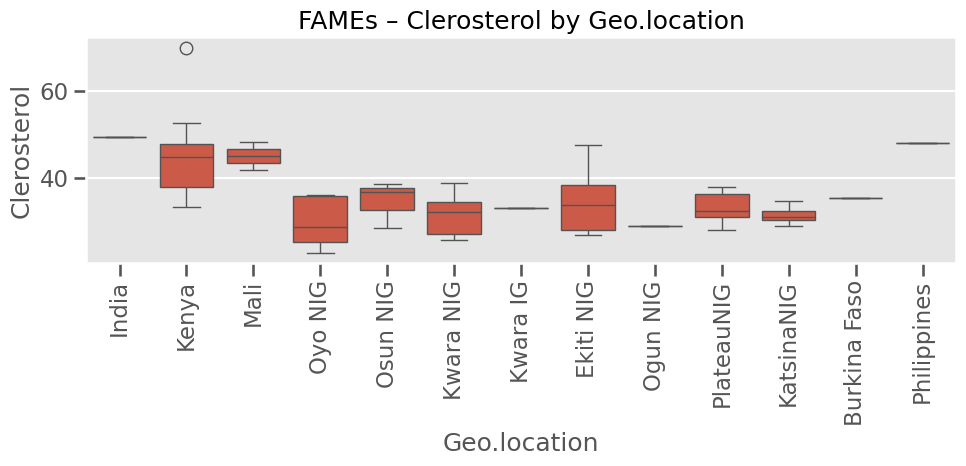

✅ Saved: Clerosterol_boxplot.png


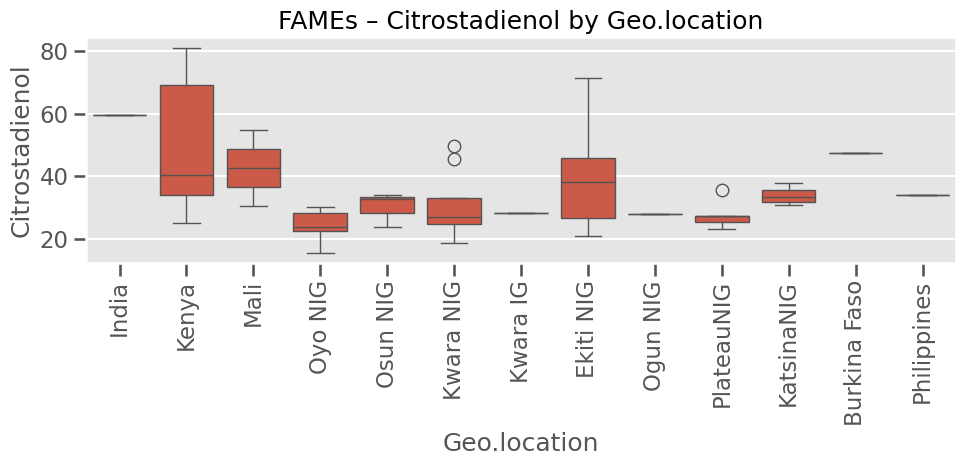

✅ Saved: Citrostadienol_boxplot.png


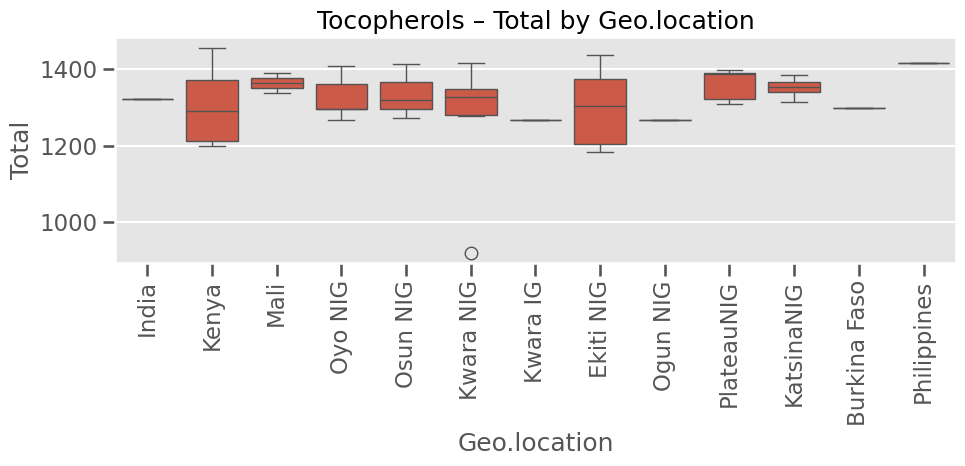

✅ Saved: Total_boxplot.png


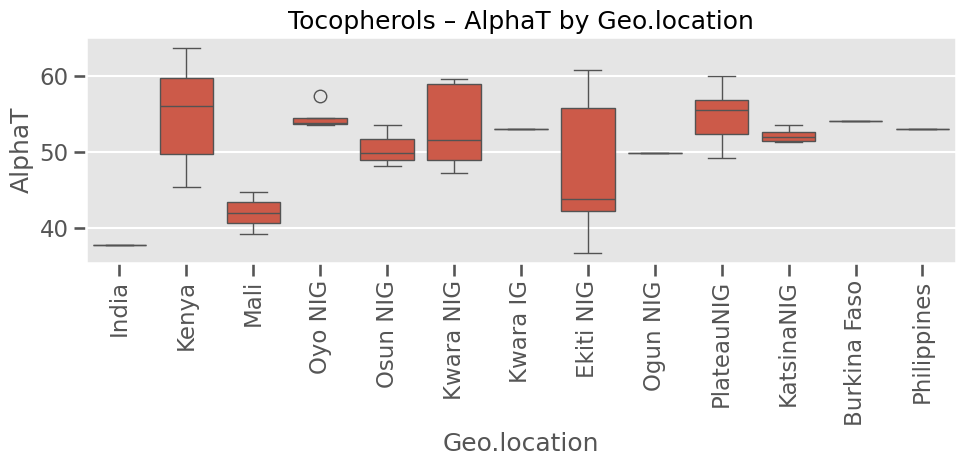

✅ Saved: AlphaT_boxplot.png


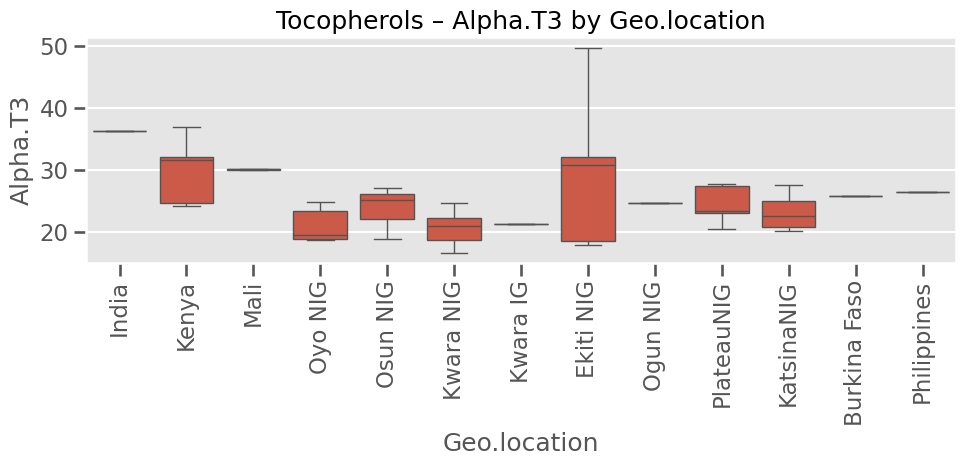

✅ Saved: Alpha.T3_boxplot.png


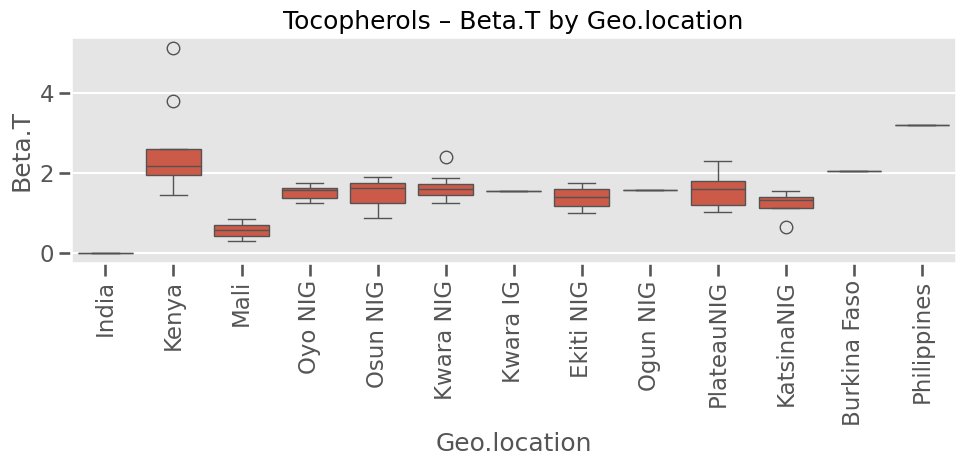

✅ Saved: Beta.T_boxplot.png


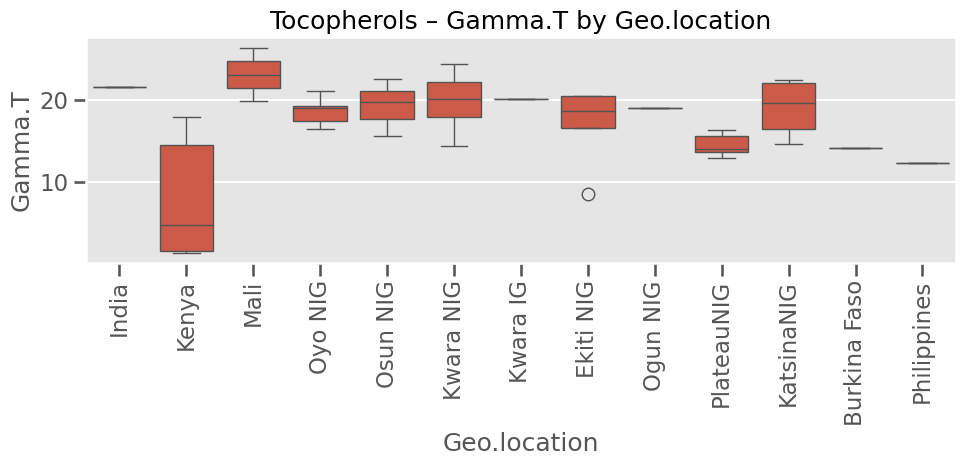

✅ Saved: Gamma.T_boxplot.png


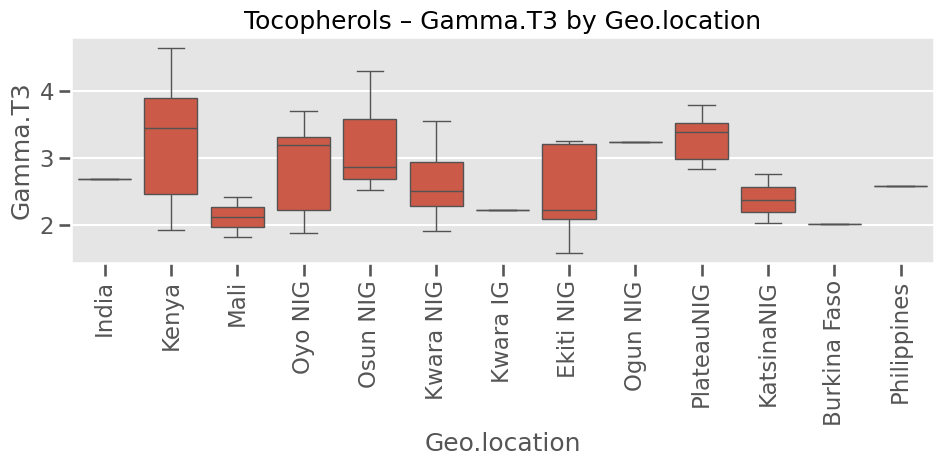

✅ Saved: Gamma.T3_boxplot.png


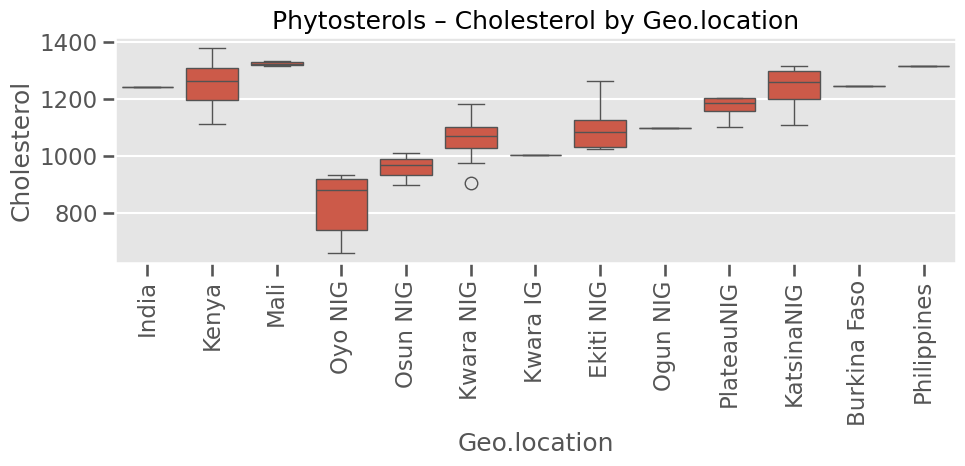

✅ Saved: Cholesterol_boxplot.png


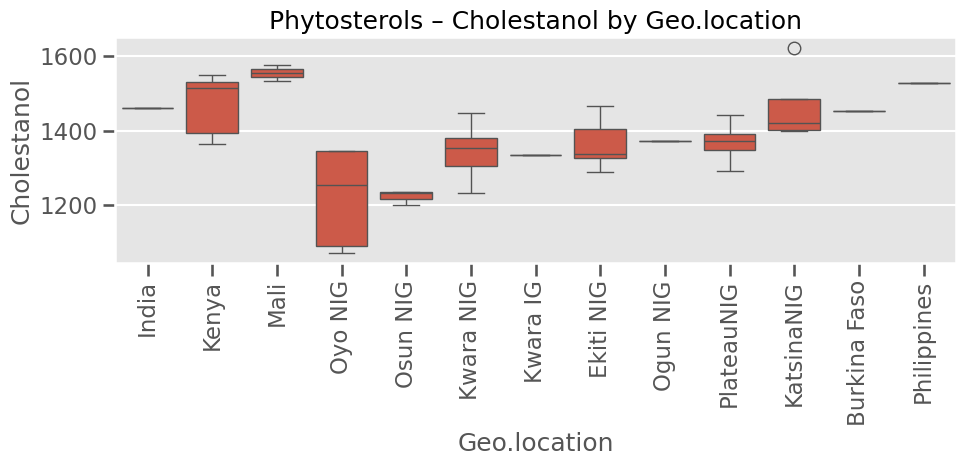

✅ Saved: Cholestanol_boxplot.png


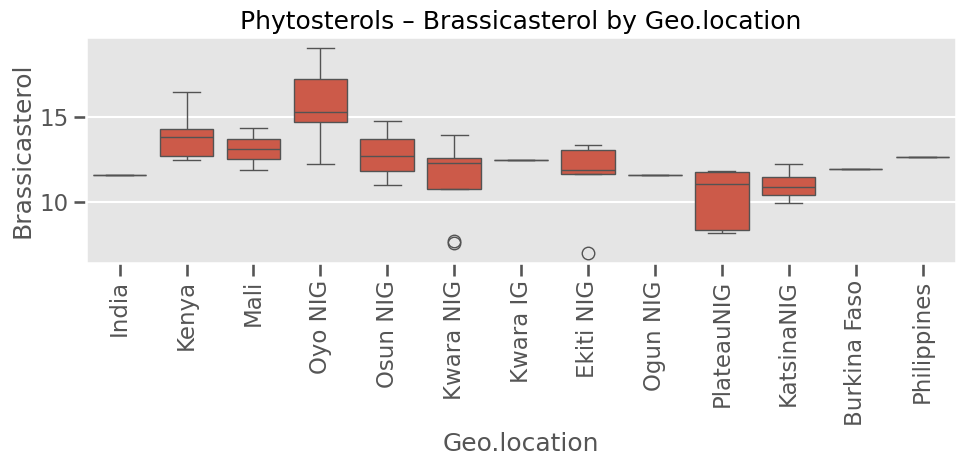

✅ Saved: Brassicasterol_boxplot.png


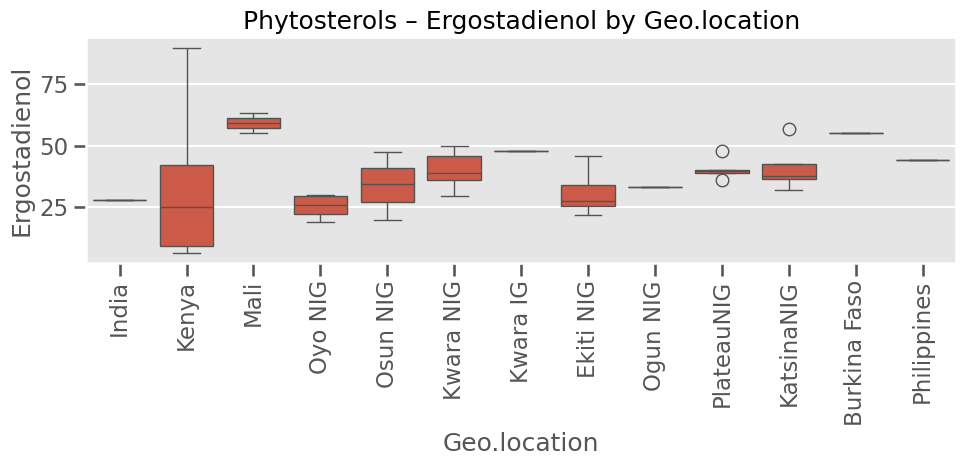

✅ Saved: Ergostadienol_boxplot.png


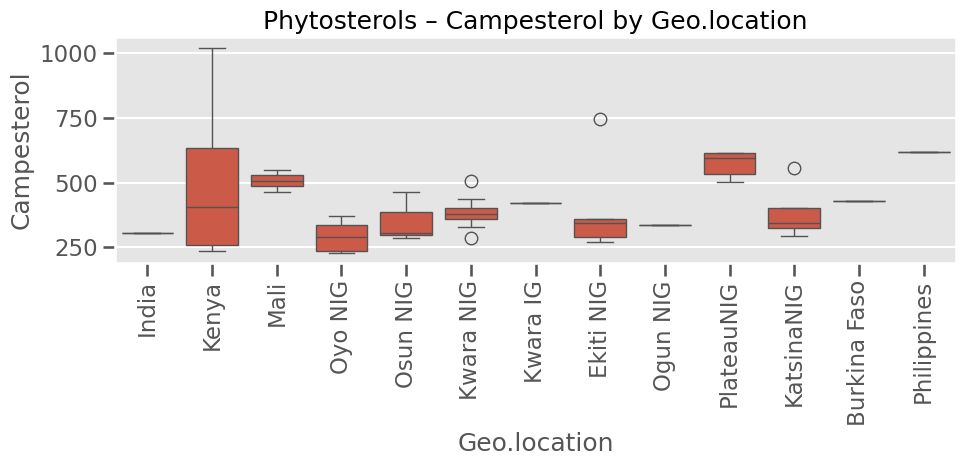

✅ Saved: Campesterol_boxplot.png


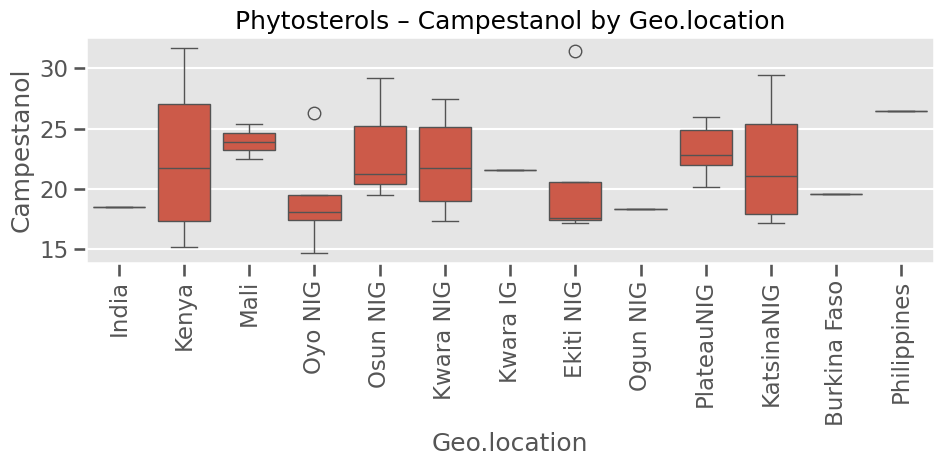

✅ Saved: Campestanol_boxplot.png


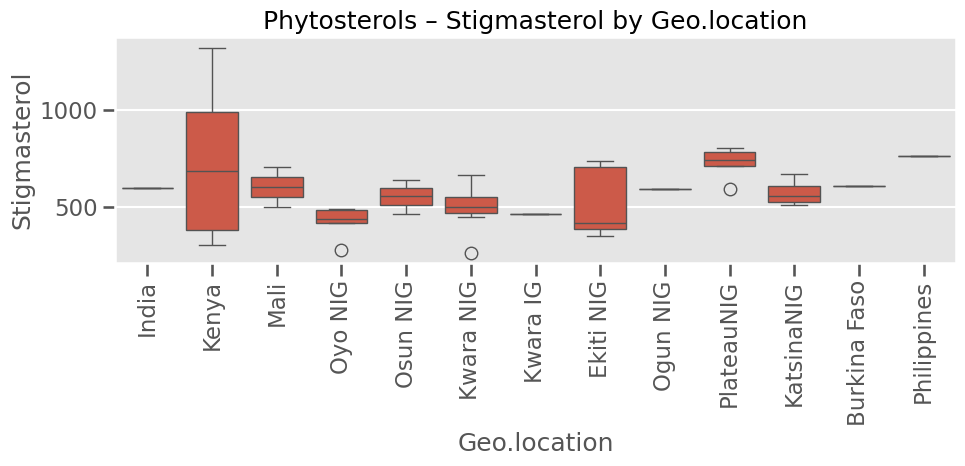

✅ Saved: Stigmasterol_boxplot.png


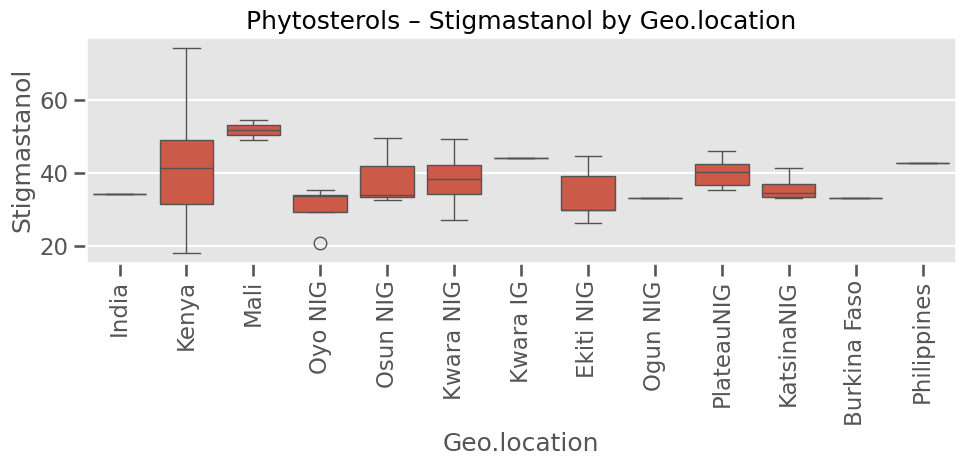

✅ Saved: Stigmastanol_boxplot.png


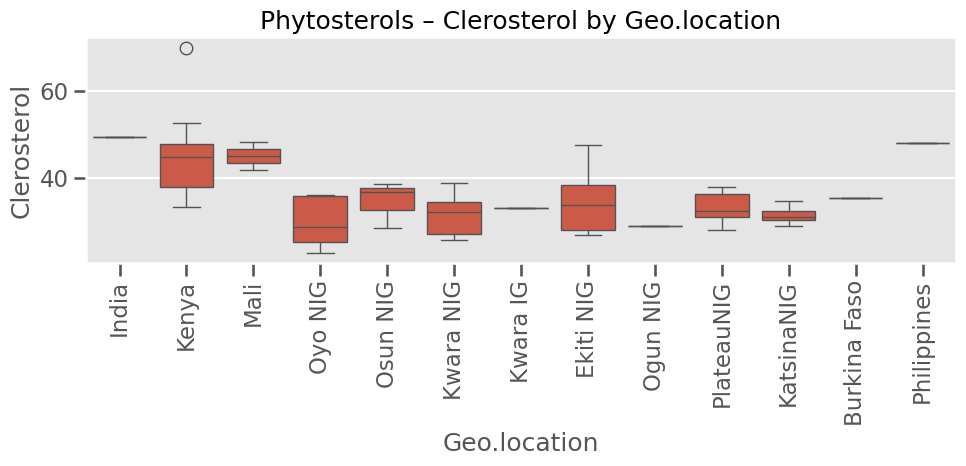

✅ Saved: Clerosterol_boxplot.png


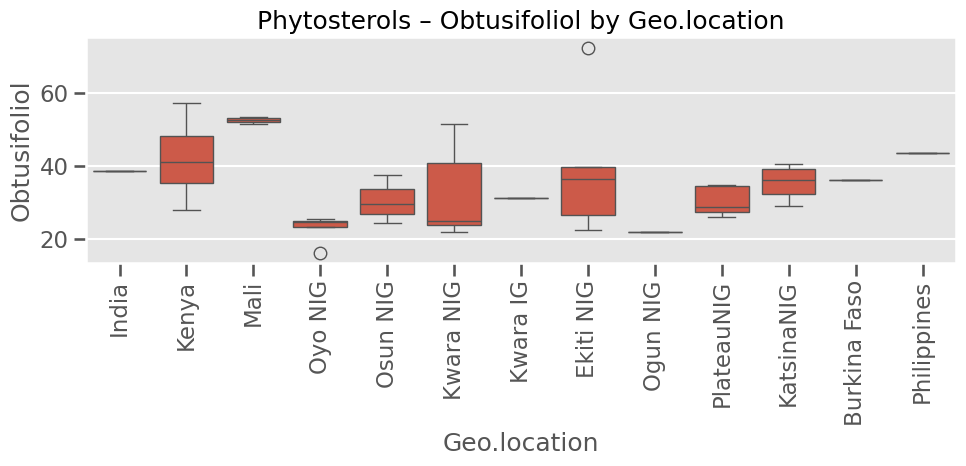

✅ Saved: Obtusifoliol_boxplot.png


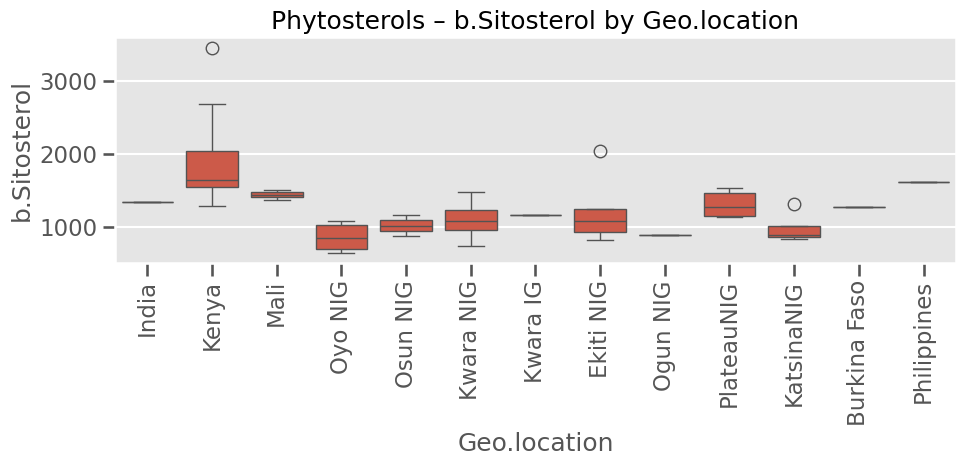

✅ Saved: b.Sitosterol_boxplot.png


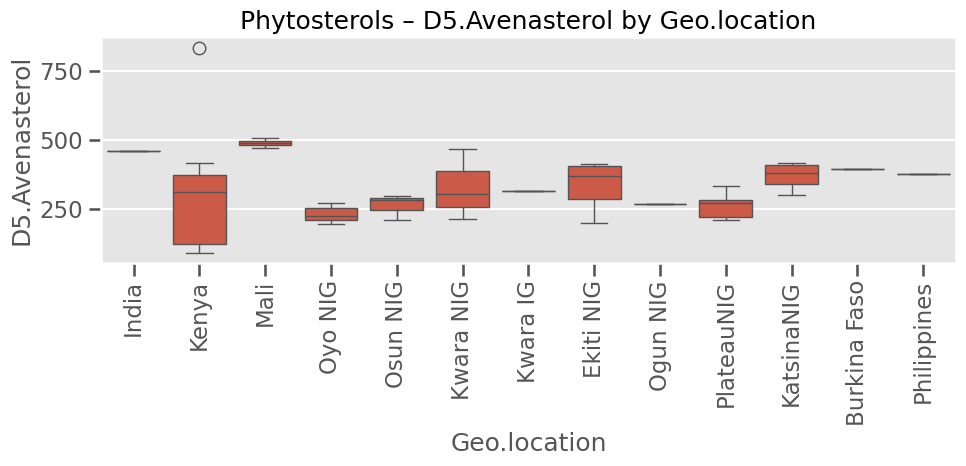

✅ Saved: D5.Avenasterol_boxplot.png


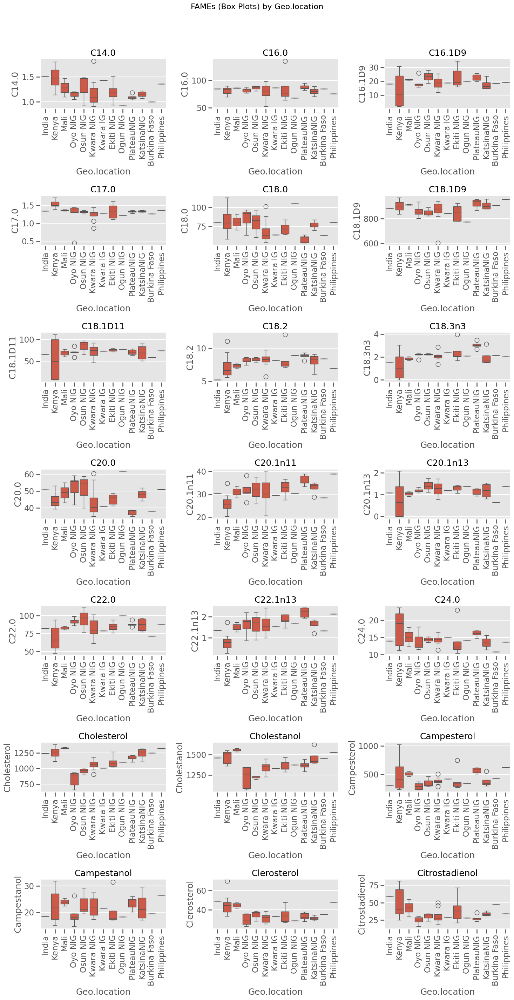

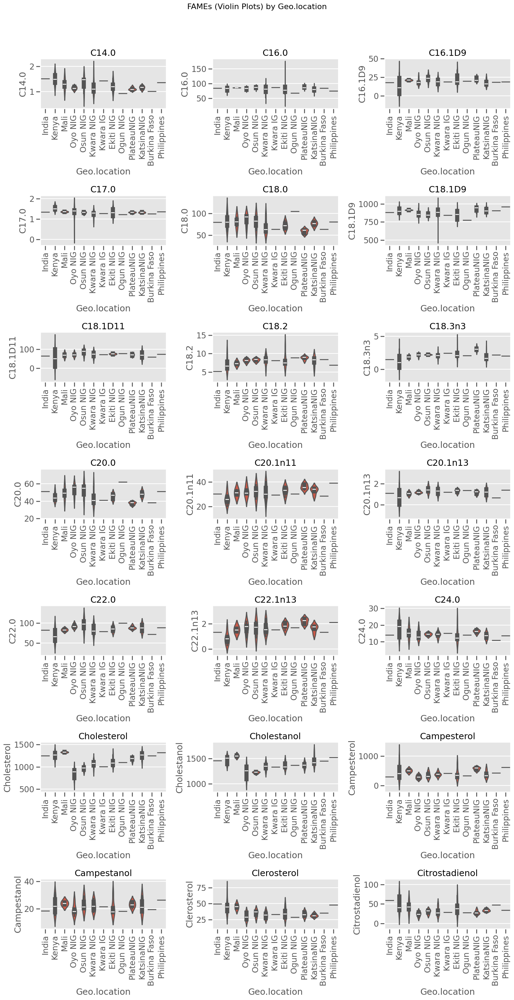

NameError: name 'compute_regional_means' is not defined

In [66]:
# Define chemical columns
FAMEs_cols = [col for col in df.columns if col.startswith("C")]
Tocopherol_cols = [col for col in df.columns if "Toc" in col or "T" in col or "Tocopherol" in col]
Phytosterol_cols = [col for col in df.columns if col.lower() in [ 'cholesterol', 'cholestanol', 'brassicasterol', 'ergostadienol', 'campesterol', 'campestanol', 'stigmasterol', 'stigmastanol', 'clerosterol', 'obtusifoliol','β‑sitosterol','b.sitosterol', 'd5.avenasterol', 'X24.Methyl.Cycloart', 'Citrostadienol']]

# 1. Separate figures
plot_individual_boxplots(df, FAMEs_cols, "FAMEs")
plot_individual_boxplots(df, Tocopherol_cols, "Tocopherols")
plot_individual_boxplots(df, Phytosterol_cols, "Phytosterols")

# 2. Grouped violin or boxplots
plot_grouped_violin_or_box(df, FAMEs_cols, "FAMEs", plot_type="box")
plot_grouped_violin_or_box(df, FAMEs_cols, "FAMEs", plot_type="violin")

#3. Regional mean tables
compute_regional_means(df, FAMEs_cols, "FAMEs", sort_by="C16.0")
compute_regional_means(df, Tocopherol_cols, "Tocopherols")
compute_regional_means(df, Phytosterol_cols, "Phytosterols")

In [4]:
def compute_regional_means(df, cols, compound_type, sort_by=None):
    """Computes and prints regional means for specified columns."""
    regional_means = df.groupby("Geo.location")[cols].mean()
    if sort_by and sort_by in regional_means.columns:
        regional_means = regional_means.sort_values(sort_by, ascending=False)
    print(f"\nRegional Means for {compound_type}:")
    display(regional_means.round(2))

In [75]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import numpy as np
import scipy.stats as stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm
from statsmodels.formula.api import ols
# from patsy import Q # Import Q - Removed direct import

# Simulate minimal structure for demonstration
# These would normally be loaded from your real dataset
geo_locations = ['Loc1', 'Loc2', 'Loc3', 'Loc4']
sample_data = {
    'Geo.location': np.random.choice(geo_locations, 100),
    'C16.0': np.random.rand(100) * 10 + 30,
    'C18.1': np.random.rand(100) * 10 + 40,
    'Campesterol': np.random.rand(100) * 5 + 10,
    'Alpha-T': np.random.rand(100) * 2 + 5
}
df = pd.DataFrame(sample_data)

# Define compound groups
FAMEs_cols = ['C16.0', 'C18.1']
Phytosterol_cols = ['Campesterol']
Tocopherol_cols = ['Alpha-T']

# Create directory for figures
figure_dir = "/mnt/data/figures/"
os.makedirs(figure_dir, exist_ok=True)

# --- Function to compute and plot regional means heatmap ---
def plot_regional_means_heatmap(df, compound_cols, compound_type):
    heatmap_data = df.groupby("Geo.location")[compound_cols].mean()
    plt.figure(figsize=(10, len(heatmap_data) * 0.5 + 2))
    sns.heatmap(heatmap_data, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5, cbar_kws={'label': 'Mean Concentration'})
    plt.title(f"Regional Mean Heatmap: {compound_type}")
    plt.xlabel("Compounds")
    plt.ylabel("Geo.location")
    plt.tight_layout()
    filename = os.path.join(figure_dir, f"{compound_type}_regional_means_heatmap.png")
    plt.savefig(filename, dpi=300)
    plt.close()
    return filename

# --- Function to run ANOVA and Tukey HSD ---
def run_anova_tukey(df, compound, group_col="Geo.location"):
    print(f"\n--- ANOVA + Tukey HSD for {compound} ---")
    # Use Q() directly in the formula
    model = ols(f'Q("{compound}") ~ C(Q("{group_col}"))', data=df).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    print(anova_table)

    # Tukey HSD
    tukey = pairwise_tukeyhsd(endog=df[compound], groups=df[group_col], alpha=0.05)
    print(tukey.summary())

# --- Function to run t-test between two regions (if needed) ---
def run_t_test(df, compound, group1, group2, group_col="Geo.location"):
    vals1 = df[df[group_col] == group1][compound]
    vals2 = df[df[group_col] == group2][compound]
    t_stat, p_val = stats.ttest_ind(vals1, vals2, equal_var=False)
    print(f"\n--- T-test for {compound} between {group1} and {group2} ---")
    print(f"T-statistic: {t_stat:.4f}, p-value: {p_val:.4e}")

# --- Function to run linear regression ---
def run_regression(df, compound, predictor="Latitude"):
    print(f"\n--- Regression: {compound} ~ {predictor} ---")
    if predictor not in df.columns:
        print(f"Predictor '{predictor}' not in dataframe.")
        return
    # Use Q() directly in the formula
    model = ols(f'Q("{compound}") ~ Q("{predictor}")', data=df).fit()
    print(model.summary())

# Example executions (replace with full compound lists and real dataset)
heatmap1 = plot_regional_means_heatmap(df, FAMEs_cols, "FAMEs")
heatmap2 = plot_regional_means_heatmap(df, Phytosterol_cols, "Phytosterols")
heatmap3 = plot_regional_means_heatmap(df, Tocopherol_cols, "Tocopherols")

# Run example stats for C16.0
run_anova_tukey(df, "C16.0")
run_t_test(df, "C16.0", "Loc1", "Loc2")
run_regression(df.assign(Latitude=np.random.uniform(-10, 10, 100)), "C16.0", "Latitude")


--- ANOVA + Tukey HSD for C16.0 ---
                          sum_sq    df         F   PR(>F)
C(Q("Geo.location"))   35.010024   3.0  1.400345  0.24746
Residual              800.032135  96.0       NaN      NaN
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
  Loc1   Loc2   -1.427 0.3426 -3.6549 0.8008  False
  Loc1   Loc3   0.0463 0.9999  -1.932 2.0245  False
  Loc1   Loc4  -0.5872 0.9182 -2.9799 1.8055  False
  Loc2   Loc3   1.4733 0.2367 -0.5587 3.5054  False
  Loc2   Loc4   0.8398 0.8044 -1.5975 3.2772  False
  Loc3   Loc4  -0.6335 0.8769  -2.845  1.578  False
---------------------------------------------------

--- T-test for C16.0 between Loc1 and Loc2 ---
T-statistic: 1.5431, p-value: 1.2998e-01

--- Regression: C16.0 ~ Latitude ---
                            OLS Regression Results                            
Dep. Variable:             Q("C16.0")   R-squared:             

              AlphaT  Alpha.T3  Beta.T  Gamma.T  Gamma.T3  Delta
Geo.location                                                    
Kenya          55.07     29.71    2.59     7.76      3.30   1.57
PlateauNIG     54.80     24.41    1.57    14.52      3.31   1.40
Oyo NIG        54.63     21.09    1.51    18.64      2.87   1.27
Burkina Faso   54.17     25.81    2.03    14.20      2.01   1.77
Kwara NIG      53.24     20.68    1.64    19.88      2.65   1.90
Philippines    53.07     26.42    3.20    12.38      2.59   2.35
Kwara IG       53.06     21.25    1.55    20.09      2.23   1.83
KatsinaNIG     52.24     23.23    1.20    19.04      2.38   1.90
Osun NIG       50.57     23.73    1.45    19.31      3.23   1.71
Ogun NIG       49.88     24.62    1.57    19.08      3.24   1.60
Ekiti NIG      47.88     29.82    1.37    16.96      2.47   1.49
Mali           42.03     30.10    0.56    23.08      2.12   2.11
India          37.74     36.26    0.00    21.55      2.69   1.75


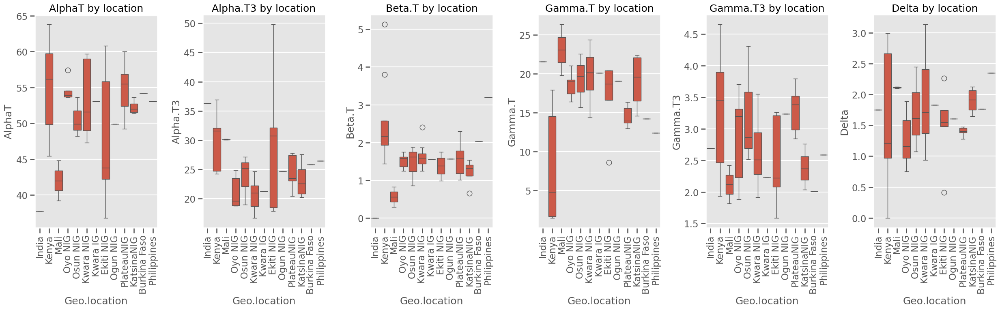

In [7]:
#6. Geography effect (box‑plots) -----------------------------------

# Recreate the merged dataframe from original data to ensure correct columns are available
dfs = [fames,tocopherols, phytosterols]
df = dfs[0]
for d in dfs[1:]:
    df = df.merge(d, on="Samples", how="inner")
df = df.merge(geo, on="Samples", how="left")   # adds Latitude, Longitude, GeoLocation

# Define headline_fa. This is needed for NUM_BLOCKS.
headline_fa = ["C14.0", "C16.0", "C16.1D9"]

# Define NUM_BLOCKS - Copied from cell LfBuOdUlIGKw to ensure it's defined
NUM_BLOCKS = {
    "FAMEs":         headline_fa +
                     [c for c in fames.columns
                      if c not in ("Samples",) + tuple(headline_fa)], # Corrected SampleID to Samples
    "Tocopherols":   [c for c in tocopherols.columns if c != "Samples"],
    "Phytosterols":  [c for c in phytosterols.columns if c != "Samples"],
}


# Define headline_tocopherols
headline_tocopherols = NUM_BLOCKS["Tocopherols"]

plt.figure(figsize=(25, 8))
# Adjust subplot grid based on the number of tocopherol variables (max 6 columns)
n_tocopherols = len(headline_tocopherols)
for i, col in enumerate(headline_tocopherols[:min(6, n_tocopherols)], 1):
    # Check if the column exists in the DataFrame before plotting
    if col in df.columns:
        plt.subplot(1, min(6, n_tocopherols), i)
        sns.boxplot(data=df, x="Geo.location", y=col)
        plt.xticks(rotation=90)
        plt.title(f"{col} by location")
plt.tight_layout()

# Use the correct column name 'Alpha-T' for sorting if it exists
sort_col = "Alpha-T" if "Alpha-T" in df.columns else "AlphaT" # Fallback to 'AlphaT' if 'Alpha-T' not found
if sort_col in df.columns and all(col in df.columns for col in headline_tocopherols):
    regional_means = df.groupby("Geo.location")[headline_tocopherols].mean().sort_values(sort_col, ascending=False)
    print(regional_means.round(2))
else:
    print(f"Skipping regional means calculation as required columns are not in the DataFrame.")

              Cholesterol  Cholestanol  Brassicasterol  Ergostadienol  \
Geo.location                                                            
Mali              1324.93      1554.82           13.12          59.09   
Philippines       1317.51      1527.10           12.62          44.27   
Kenya             1255.23      1473.02           13.82          32.11   
Burkina Faso      1245.83      1451.87           11.94          55.06   
India             1244.37      1460.51           11.59          27.86   
KatsinaNIG        1237.82      1465.00           10.98          41.22   
PlateauNIG        1172.31      1369.27           10.23          40.50   
Ekiti NIG         1106.88      1364.88           11.39          30.87   
Ogun NIG          1100.37      1373.37           11.55          33.29   
Kwara NIG         1058.44      1343.35           11.34          40.21   
Kwara IG          1005.54      1333.92           12.47          47.83   
Osun NIG           959.63      1224.37           12

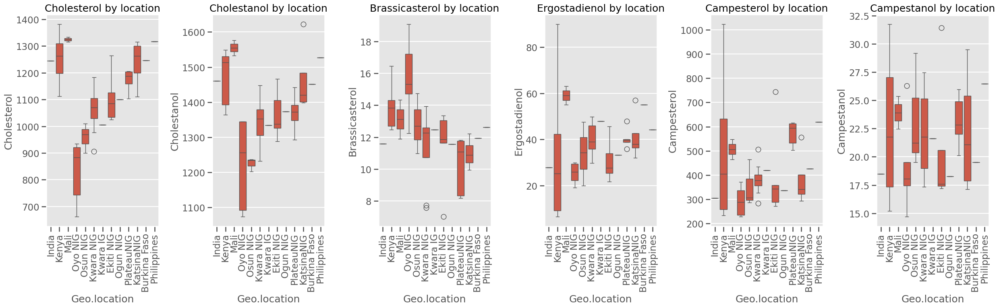

In [8]:
# Define headline_phytosterols
headline_phytosterols = NUM_BLOCKS["Phytosterols"]

plt.figure(figsize=(25, 8))
# Adjust subplot grid based on the number of phytosterols variables (max 6 columns)
n_phytosterols = len(headline_phytosterols)
for i, col in enumerate(headline_phytosterols[:min(6, n_phytosterols)], 1):
    plt.subplot(1, min(6, n_phytosterols), i)
    sns.boxplot(data=df, x="Geo.location", y=col)
    plt.xticks(rotation=90)
    plt.title(f"{col} by location")
plt.tight_layout()

regional_means = df.groupby("Geo.location")[headline_phytosterols].mean().sort_values("Cholesterol", ascending=False)
print(regional_means.round(2))

              C14.0  C16.0  C16.1D9  C17.0   C18.0  C18.1D9  C18.1D11  C18.2  \
Geo.location                                                                   
India          1.51  84.81    18.13   1.35   80.09   882.26     65.76   5.22   
Kenya          1.49  81.62    13.46   1.54   81.81   902.04     54.51   7.29   
Kwara IG       1.43  86.64    18.88   1.29   63.84   843.96     73.15   8.14   
Philippines    1.36  75.78    19.10   1.36   80.41   957.89     74.46   6.94   
Osun NIG       1.29  86.24    23.33   1.32   79.65   852.42     84.21   8.28   
Mali           1.28  86.22    21.04   1.36   80.78   913.72     69.04   7.33   
Ekiti NIG      1.20  87.63    22.86   1.33   72.47   848.47     75.61   8.39   
Kwara NIG      1.19  80.07    18.58   1.23   69.05   854.83     72.64   8.20   
KatsinaNIG     1.15  80.03    17.66   1.33   76.85   910.14     70.03   7.98   
Oyo NIG        1.14  82.36    18.84   1.20   85.15   862.61     71.42   8.14   
PlateauNIG     1.10  87.80    22.31   1.

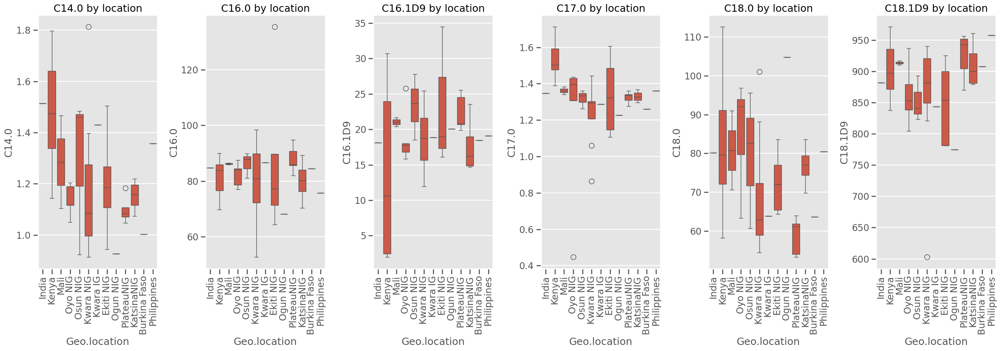

In [9]:
# Define headline_fames
headline_fames = NUM_BLOCKS["FAMEs"]

plt.figure(figsize=(25, 9))
# Adjust subplot grid based on the number of fames variables (max 6 columns)
n_fames = len(headline_fames)
for i, col in enumerate(headline_fames[:min(6, n_fames)], 1):
    plt.subplot(1, min(6, n_fames), i)
    sns.boxplot(data=df, x="Geo.location", y=col)
    plt.xticks(rotation=90)
    plt.title(f"{col} by location")
plt.tight_layout()

# Exclude non-numeric columns like 'Samples' before calculating the mean
numeric_fames_cols = df[headline_fames].select_dtypes(include=np.number).columns.tolist()
regional_means = df.groupby("Geo.location")[numeric_fames_cols].mean().sort_values("C14.0", ascending=False)
print(regional_means.round(2))

In [10]:
import os
import matplotlib.pyplot as plt
from pathlib import Path

# Define where to save figures
SAVE_DIR = Path("/content/drive/MyDrive/moringaseed_oil_location/figures")
SAVE_DIR.mkdir(parents=True, exist_ok=True)  # create if not exists

def save_fig(name, dpi=300):
    """Save current Matplotlib figure to Google Drive"""
    path = SAVE_DIR / f"{name}.png"
    plt.savefig(path, dpi=dpi, bbox_inches='tight')
    print(f"✓ Saved: {path}")


✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/PCA_FAMEs.png
✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/PCA_Tocopherols.png
✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/PCA_Phytosterols.png


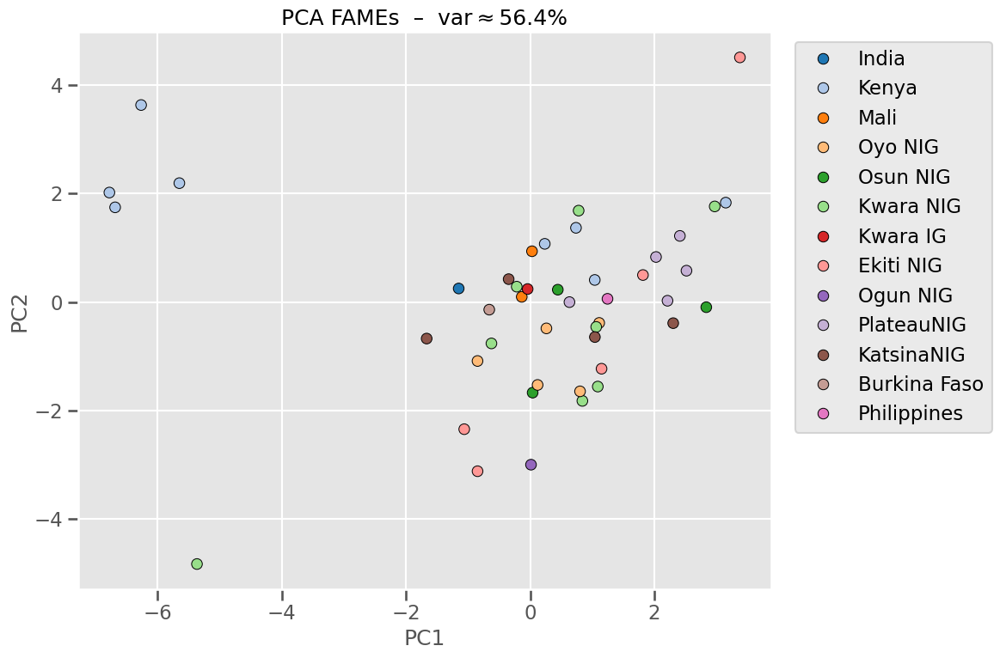

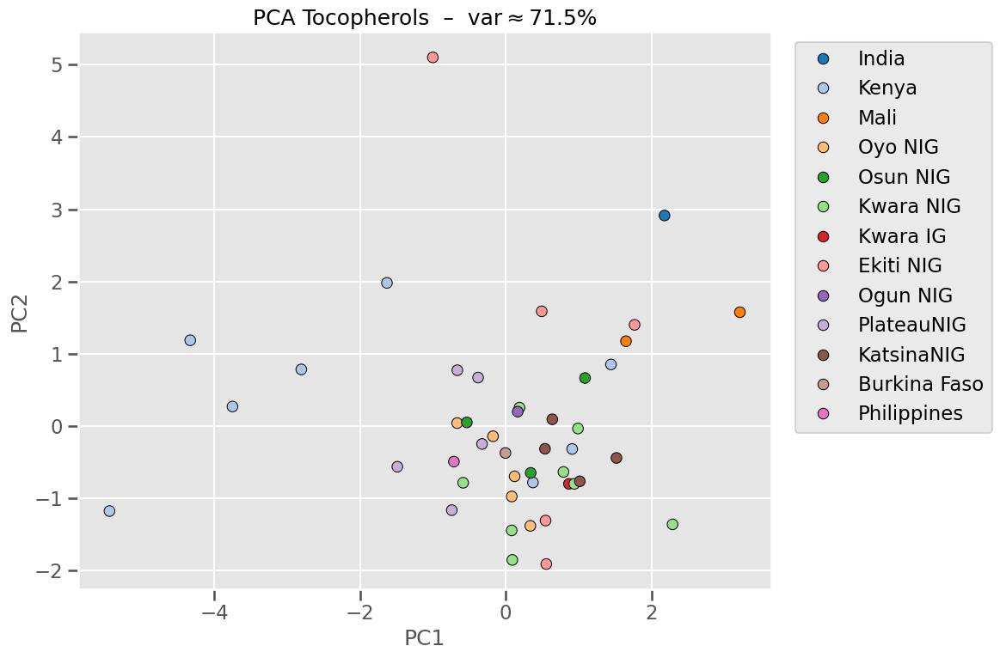

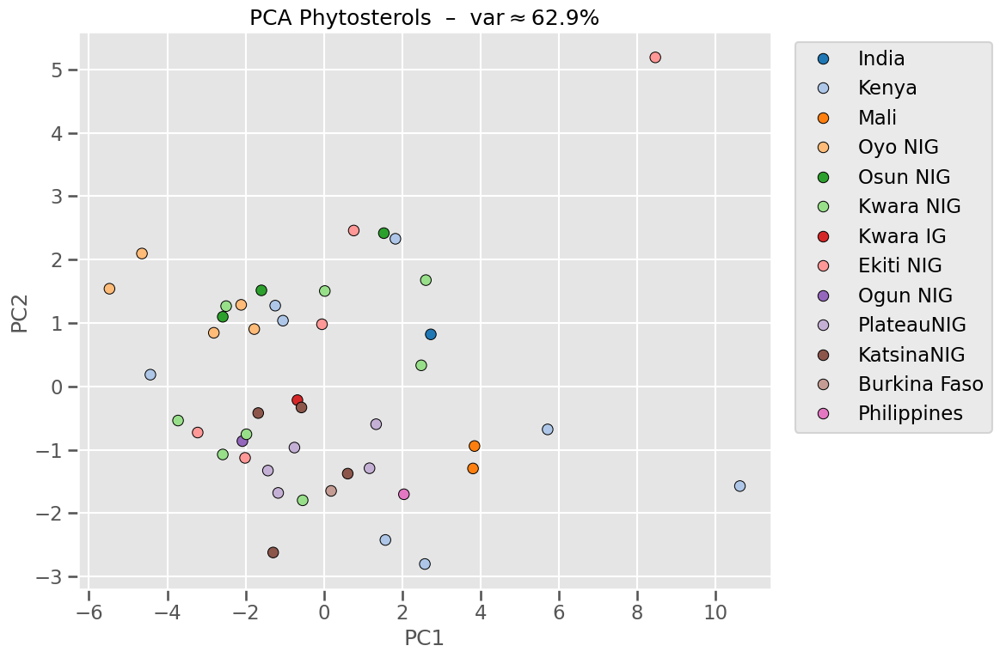

In [11]:
# 7. PCA per block ---------------------------------------------------
# ===================================================================

# Recreate the merged dataframe from original data to ensure correct columns are available
dfs = [fames,tocopherols, phytosterols]
df_merged = dfs[0]
for d in dfs[1:]:
    df_merged = df_merged.merge(d, on="Samples", how="inner")
df_merged = df_merged.merge(geo, on="Samples", how="left")   # adds Latitude, Longitude, GeoLocation

def pca_scatter(data, label_col, title):
    X = StandardScaler().fit_transform(data)
    pca = PCA(n_components=2, random_state=42)
    pcs = pca.fit_transform(X)
    pc_df = pd.DataFrame(pcs, columns=["PC1","PC2"])
    pc_df[label_col] = df_merged[label_col].values # Use df_merged here
    sns.scatterplot(data=pc_df, x="PC1", y="PC2",
                    hue=label_col, palette="tab20", s=80, edgecolor="k")
    plt.title(f"{title}  –  var ≈ {pca.explained_variance_ratio_.sum():.1%}")
    plt.legend(bbox_to_anchor=(1.02,1), loc="upper left")
    plt.tight_layout()

for block, cols in NUM_BLOCKS.items():
    plt.figure(figsize=(12,8))
    # Exclude non-numeric columns like 'Samples' from PCA calculation
    # Use df_merged for column selection
    numeric_cols = df_merged[cols].select_dtypes(include=np.number).columns.tolist()
    if numeric_cols: # Ensure there are numeric columns to perform PCA on
        pca_scatter(df_merged[numeric_cols], "Geo.location", f"PCA {block}") # Use df_merged here
        save_fig(f"PCA_{block}")
    else:
        print(f"Skipping PCA for {block} as no numeric columns found.")

✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/K-means_FAMEs.png


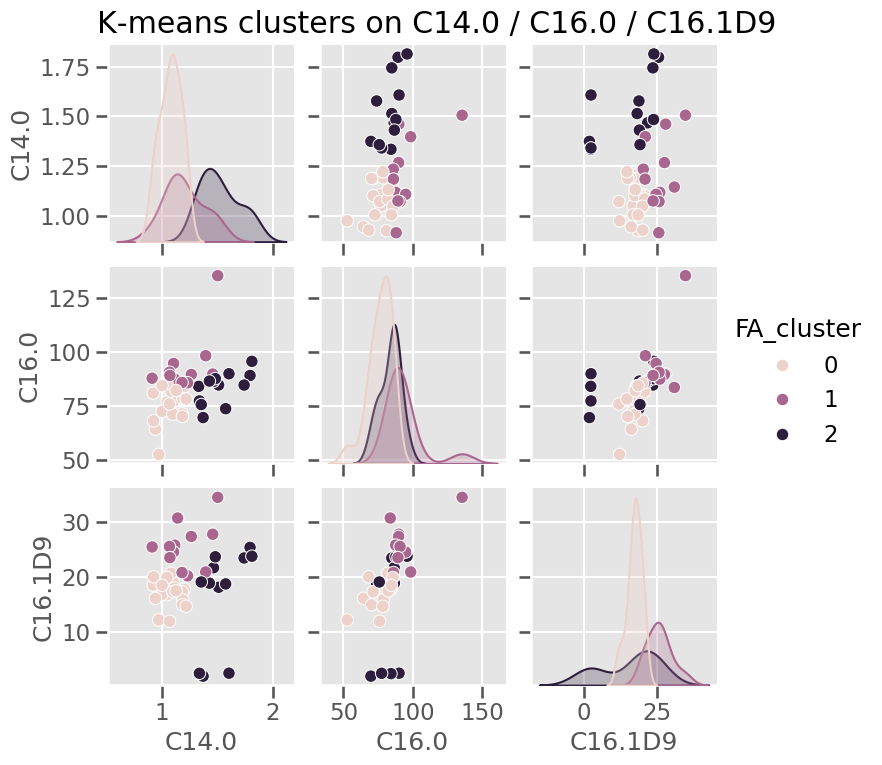

In [19]:
# 8. K‑means on headline fatty acids ---------------------------------

# Recreate the merged dataframe from original data to ensure correct data is available
dfs = [fames,tocopherols, phytosterols]
df = dfs[0]
for d in dfs[1:]:
    df = df.merge(d, on="Samples", how="inner")
df = df.merge(geo, on="Samples", how="left")   # adds Latitude, Longitude, GeoLocation

# Define headline_fa (needed for K-means)
headline_fa = ["C14.0", "C16.0", "C16.1D9"]


X_head = StandardScaler().fit_transform(df[headline_fa])
df["FA_cluster"] = KMeans(n_clusters=3, random_state=42).fit_predict(X_head)

sns.pairplot(df, vars=headline_fa, hue="FA_cluster")
plt.suptitle("K‑means clusters on C14.0 / C16.0 / C16.1D9", y=1.02)

save_fig("K-means_FAMEs")

✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/K-means_Tocopherols.png


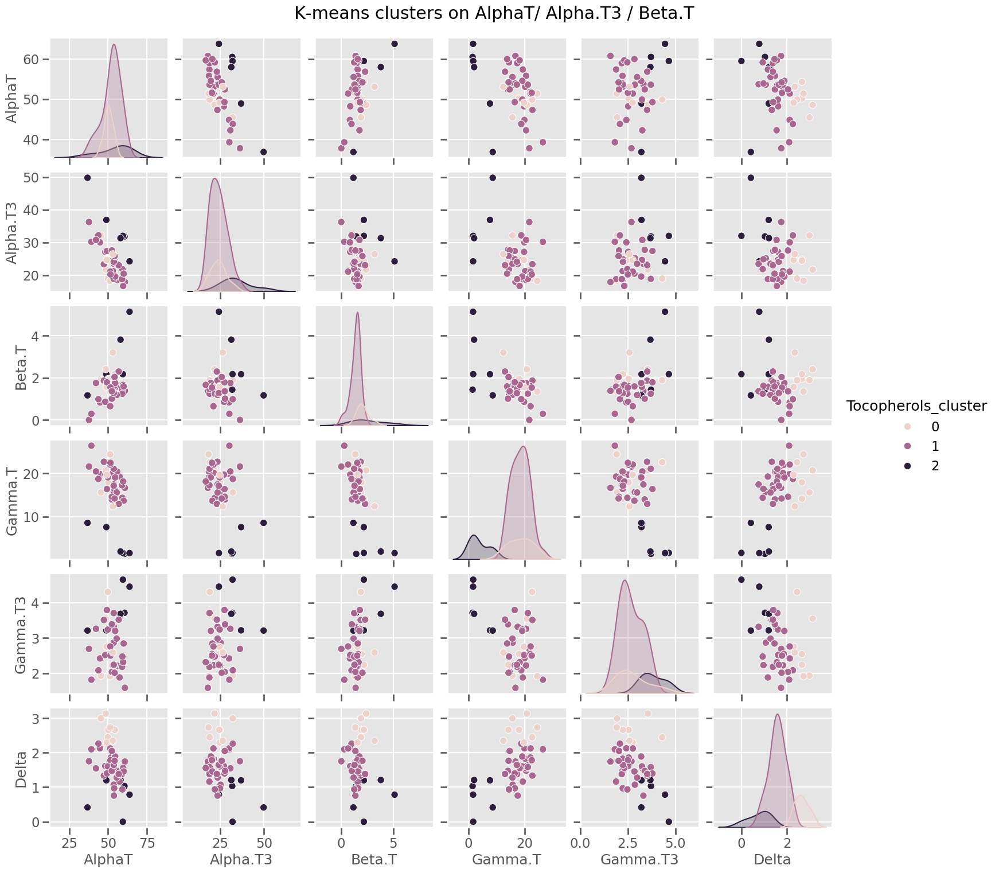

In [22]:
# K‑means on headline tocopherols ---------------------------------

# Recreate the merged dataframe from original data to ensure correct data is available
dfs = [fames,tocopherols, phytosterols]
df = dfs[0]
for d in dfs[1:]:
    df = df.merge(d, on="Samples", how="inner")
df = df.merge(geo, on="Samples", how="left")   # adds Latitude, Longitude, GeoLocation

# Define NUM_BLOCKS to get headline_tocopherols
# Define headline_fa. This is needed for NUM_BLOCKS.
headline_fa = ["C14.0", "C16.0", "C16.1D9"]

# Define NUM_BLOCKS - Copied from cell LfBuOdUlIGKw to ensure it's defined
NUM_BLOCKS = {
    "FAMEs":         headline_fa +
                     [c for c in fames.columns
                      if c not in ("Samples",) + tuple(headline_fa)], # Corrected SampleID to Samples
    "Tocopherols":   [c for c in tocopherols.columns if c != "Samples"],
    "Phytosterols":  [c for c in phytosterols.columns if c != "Samples"],
}

# Define headline_tocopherols
headline_tocopherols = NUM_BLOCKS["Tocopherols"]


X_head = StandardScaler().fit_transform(df[headline_tocopherols])
df["Tocopherols_cluster"] = KMeans(n_clusters=3, random_state=42).fit_predict(X_head)

sns.pairplot(df, vars=headline_tocopherols, hue="Tocopherols_cluster")
plt.suptitle("K‑means clusters on AlphaT/ Alpha.T3 / Beta.T", y=1.02)

save_fig("K-means_Tocopherols")

✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/K-means_Phytosterols.png


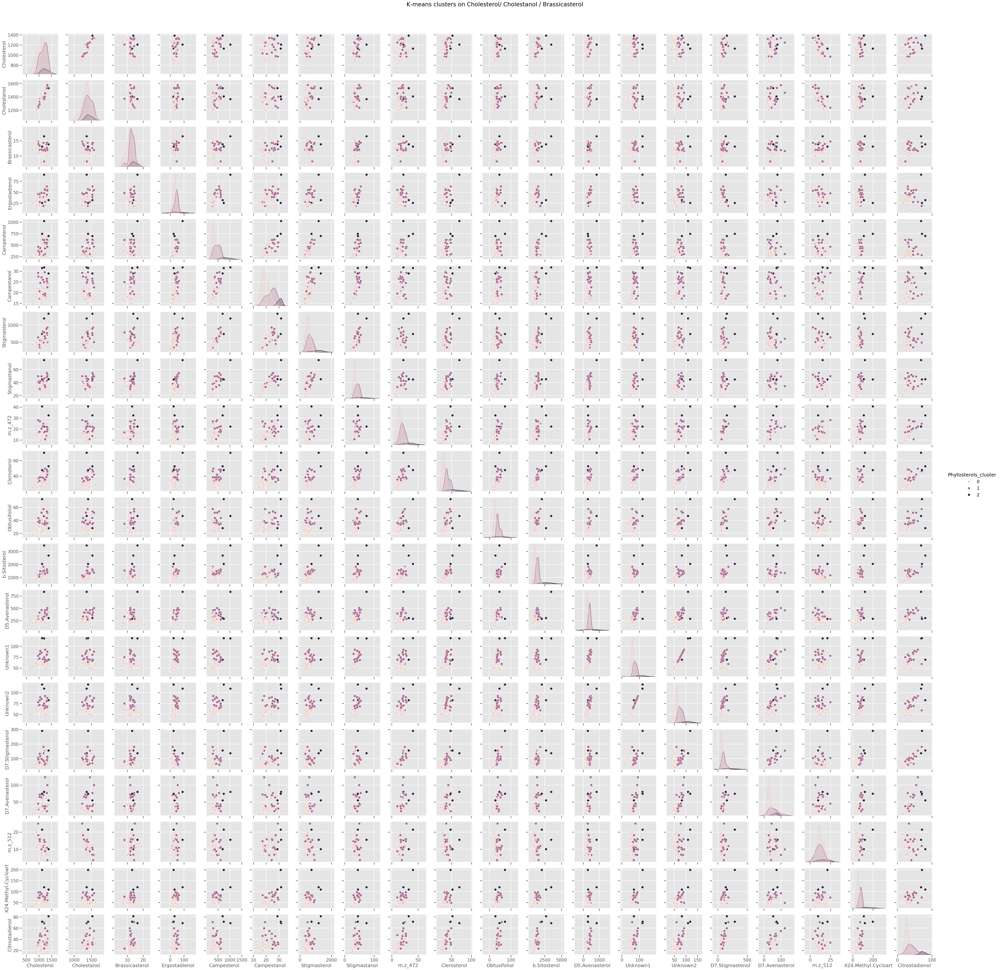

In [23]:
# K‑means on headline phytosterols ---------------------------------

# Recreate the merged dataframe from original data to ensure correct data is available
dfs = [fames,tocopherols, phytosterols]
df = dfs[0]
for d in dfs[1:]:
    df = df.merge(d, on="Samples", how="inner")
df = df.merge(geo, on="Samples", how="left")   # adds Latitude, Longitude, GeoLocation

# Define NUM_BLOCKS to get headline_phytosterols
# Define headline_fa. This is needed for NUM_BLOCKS.
headline_fa = ["C14.0", "C16.0", "C16.1D9"]

# Define NUM_BLOCKS - Copied from cell LfBuOdUlIGKw to ensure it's defined
NUM_BLOCKS = {
    "FAMEs":         headline_fa +
                     [c for c in fames.columns
                      if c not in ("Samples",) + tuple(headline_fa)], # Corrected SampleID to Samples
    "Tocopherols":   [c for c in tocopherols.columns if c != "Samples"],
    "Phytosterols":  [c for c in phytosterols.columns if c != "Samples"],
}


# Define headline_phytosterols
headline_phytosterols = NUM_BLOCKS["Phytosterols"]


X_head = StandardScaler().fit_transform(df[headline_phytosterols])
df["Phytosterols_cluster"] = KMeans(n_clusters=3, random_state=42).fit_predict(X_head)

sns.pairplot(df, vars=headline_phytosterols, hue="Phytosterols_cluster")
plt.suptitle("K‑means clusters on Cholesterol/ Cholestanol / Brassicasterol", y=1.02)

save_fig("K-means_Phytosterols")

In [93]:
#Radar plot
def radar_plot_top_fames(df, compound_cols, title, filename):
    # Step 1: Calculate total fatty acid content
    # Assuming you want to sum the columns passed in compound_cols
    df["Total_FAMEs"] = df[compound_cols].sum(axis=1)

    # Step 2: Pick top 3 accessions
    top_samples = df.nlargest(3, "Total_FAMEs")["Samples"]

    # Step 3: Normalize all FAMEs for these samples
    subset = df[df["Samples"].isin(top_samples)][["Samples"] + compound_cols].copy()
    subset.set_index("Samples", inplace=True)
    norm_subset = (subset - subset.min()) / (subset.max() - subset.min())

    # Step 4: Set up radar plot
    angles = np.linspace(0, 2*np.pi, len(compound_cols), endpoint=False)
    angles = np.concatenate([angles, [angles[0]]])

    fig = plt.figure(figsize=(8, 8))
    ax = plt.subplot(111, polar=True)

    for idx, row in norm_subset.iterrows():
        values = np.concatenate([row.values, [row.values[0]]])
        ax.plot(angles, values, label=idx)
        ax.fill(angles, values, alpha=0.1)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(compound_cols, fontsize=10)
    ax.set_yticklabels([])
    plt.title(title, size=14)
    plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
    plt.tight_layout()
    save_fig(filename) # Pass filename to save_fig
    plt.show() # Add plt.show() to display the plot
    plt.close() # Close the plot after displaying

In [92]:
def radar_plot_top_phytosterols(df, compound_cols, title, filename):
    # Step 1: Calculate total phytosterolscontent
    # Assuming you want to sum the columns passed in compound_cols
    df["Total_Phytosterols"] = df[compound_cols].sum(axis=1)

    # Step 2: Pick top 3 accessions
    top_samples = df.nlargest(3, "Total_Phytosterols")["Samples"]

    # Step 3: Normalize all phytosterols for these samples
    subset = df[df["Samples"].isin(top_samples)][["Samples"] + compound_cols].copy()
    subset.set_index("Samples", inplace=True)
    norm_subset = (subset - subset.min()) / (subset.max() - subset.min())

    # Step 4: Set up radar plot
    angles = np.linspace(0, 2*np.pi, len(compound_cols), endpoint=False)
    angles = np.concatenate([angles, [angles[0]]])

    fig = plt.figure(figsize=(8, 8))
    ax = plt.subplot(111, polar=True)

    for idx, row in norm_subset.iterrows():
        values = np.concatenate([row.values, [row.values[0]]])
        ax.plot(angles, values, label=idx)
        ax.fill(angles, values, alpha=0.1)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(compound_cols, fontsize=10)
    ax.set_yticklabels([])
    plt.title(title, size=14)
    plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
    plt.tight_layout()
    save_fig(filename) # Pass filename to save_fig
    plt.show() # Add plt.show() to display the plot
    plt.close() # Close the plot after displaying

In [87]:
def radar_plot_top_tocopherols(df, compound_cols, title, filename):
    # Step 1: Calculate total tocopherols content
    # Assuming you want to sum the columns passed in compound_cols
    df["Total_Tocopherols"] = df[compound_cols].sum(axis=1)

    # Step 2: Pick top 3 accessions based on total tocopherols
    top_samples = df.nlargest(3, "Total_Tocopherols")["Samples"]

    # Step 3: Normalize all tocopherols for these samples
    subset = df[df["Samples"].isin(top_samples)][["Samples"] + compound_cols].copy()
    subset.set_index("Samples", inplace=True)
    norm_subset = (subset - subset.min()) / (subset.max() - subset.min())

    # Step 4: Set up radar plot
    angles = np.linspace(0, 2*np.pi, len(compound_cols), endpoint=False)
    angles = np.concatenate([angles, [angles[0]]])

    fig = plt.figure(figsize=(8, 8))
    ax = plt.subplot(111, polar=True)

    for idx, row in norm_subset.iterrows():
        values = np.concatenate([row.values, [row.values[0]]])
        ax.plot(angles, values, label=idx)
        ax.fill(angles, values, alpha=0.1)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(compound_cols, fontsize=10)
    ax.set_yticklabels([])
    plt.title(title, size=14)
    plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
    plt.tight_layout()
    save_fig(filename) # Pass filename to save_fig
    plt.show() # Add plt.show() to display the plot
    plt.close() # Close the plot after displaying

✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/radar_top_tocopherols.png


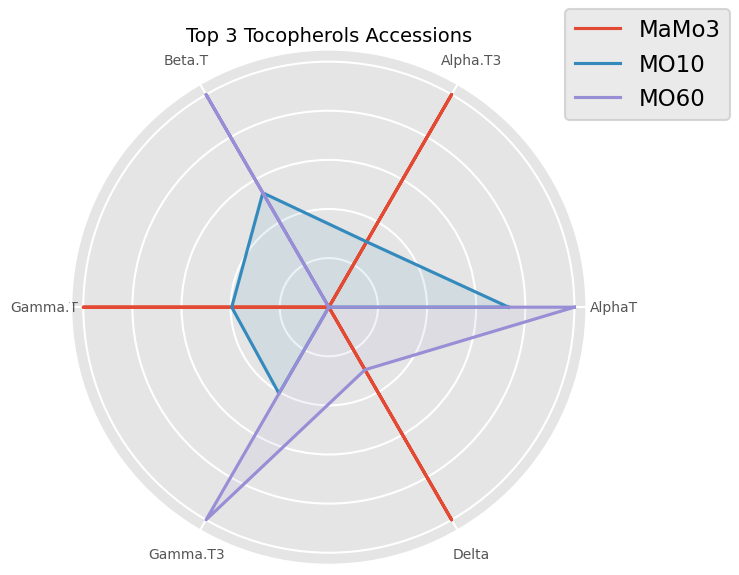

In [88]:
# Radar plot of top‑tocopherols accessions ------------------------------

# Find the top 3 samples with the highest 'AlphaT' (tocopherols)
top_tocopherols_ids = df_merged.nlargest(3, "AlphaT")["Samples"]

# Generate the radar plot for the top tocopherols accessions
# Use headline_fa for the columns, as it contains the relevant fatty acids
radar_plot_top_tocopherols(df_merged, headline_tocopherols, "Top 3 Tocopherols Accessions", "radar_top_tocopherols")

# Save the figure - save_fig is called within the radar_plot function now
# save_fig("radar_top_tocopherols")

✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/radar_top_phytosterols.png


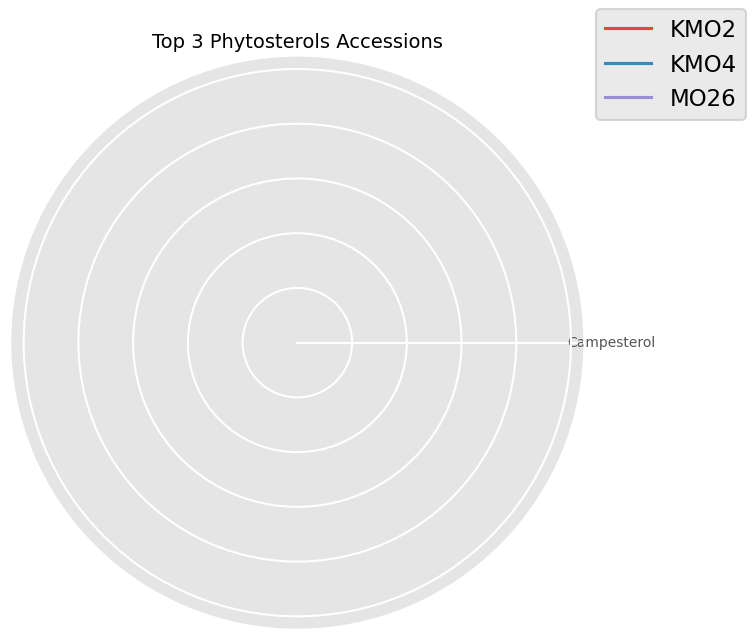

In [94]:
# Radar plot of top‑phytosterols accessions ------------------------------

# Find the top 3 samples with the highest 'Cholesterol' (phytosterols)
top_phytosterols_ids = df_merged.nlargest(3, "Cholesterol")["Samples"]

# Generate the radar plot for the top tocopherols accessions
# Use Phytosterol_cols for the columns, as it contains the relevant fatty acids
radar_plot_top_phytosterols(df_merged, Phytosterol_cols, "Top 3 Phytosterols Accessions", "radar_top_phytosterols")

# Save the figure
# save_fig("radar_top_phytosterols") # save_fig is called within the radar_plot_top_phytosterols function

✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/radar_top_phytosterols.png


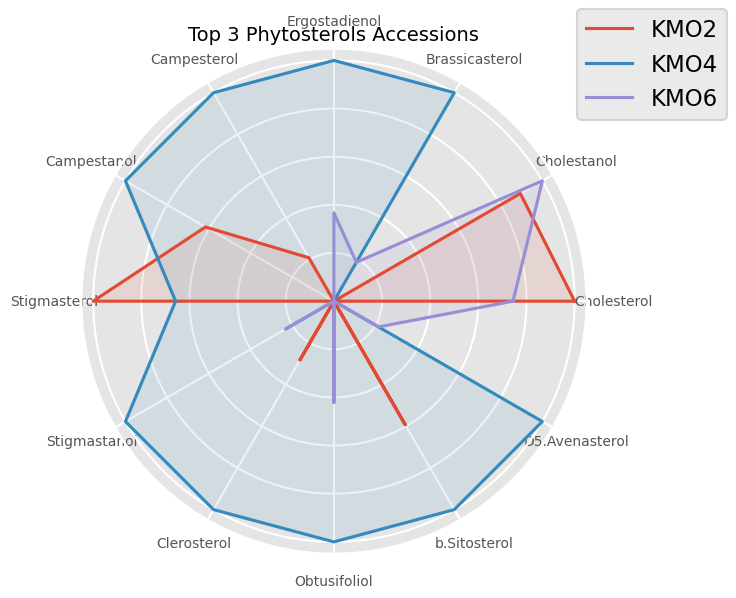

In [105]:
# Usage
top_phytosterols_ids = df_merged.nlargest(3, "Cholesterol")["Samples"]
radar_plot_top_phytosterols(df_merged, Phytosterol_cols, "Top 3 Phytosterols Accessions", "radar_top_phytosterols")

In [ ]:
# 10. Save cleaned master table -------------------------------------
out_path = ROOT / "moringa_oil_master_clean.csv"
df.to_csv(out_path, index=False)
print(f"✓ Saved merged dataset → {out_path}")

✓ Saved merged dataset → /content/drive/MyDrive/moringaseed_oil_location/moringa_oil_master_clean.csv


✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/heatmap_fames.png
✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/heatmap_tocopherols.png
✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/heatmap_phytosterols.png


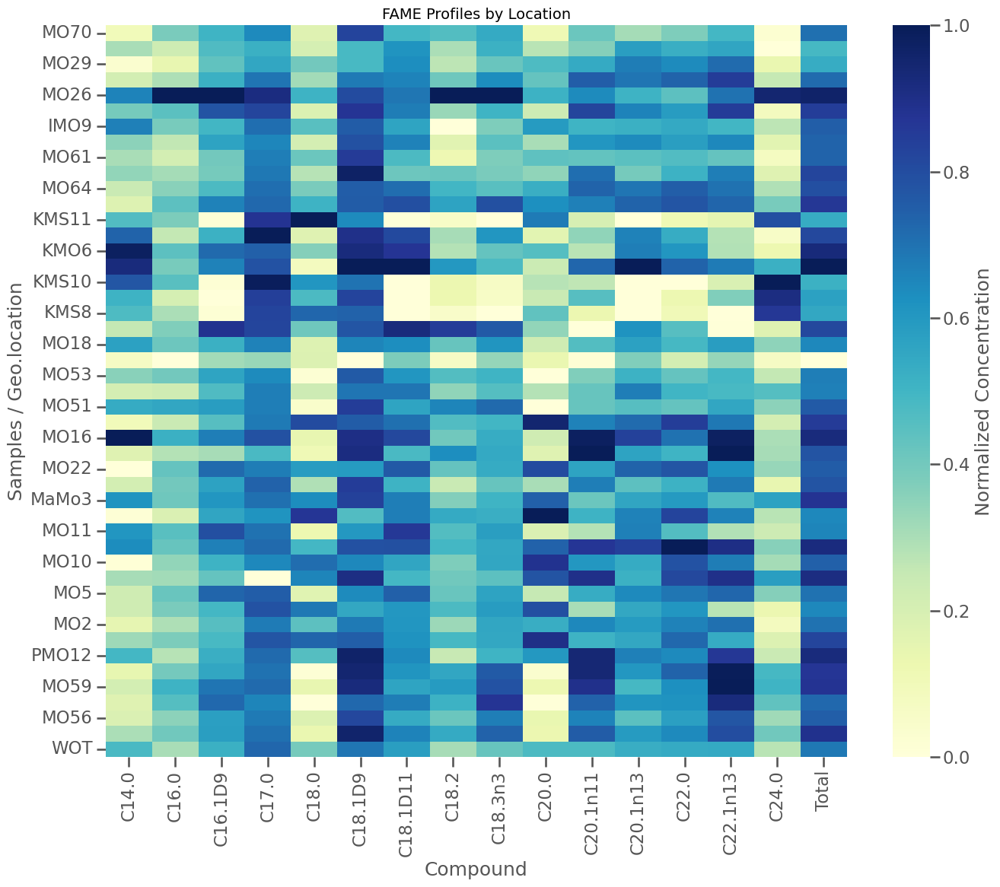

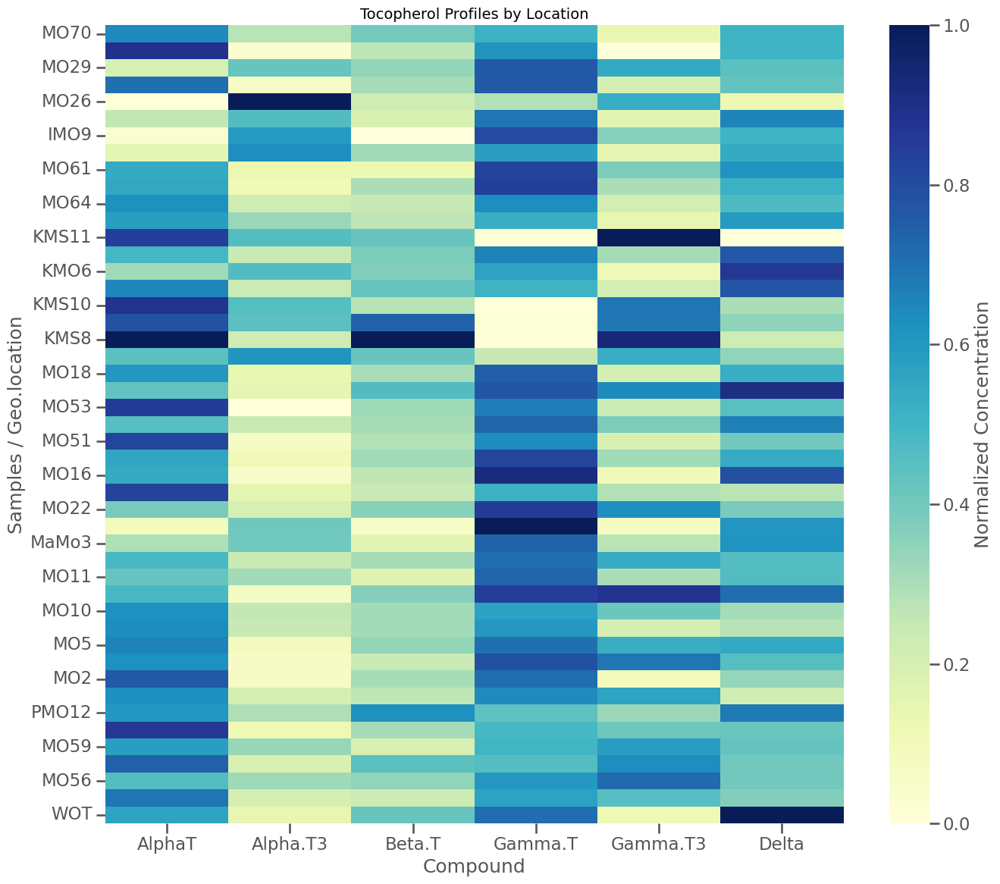

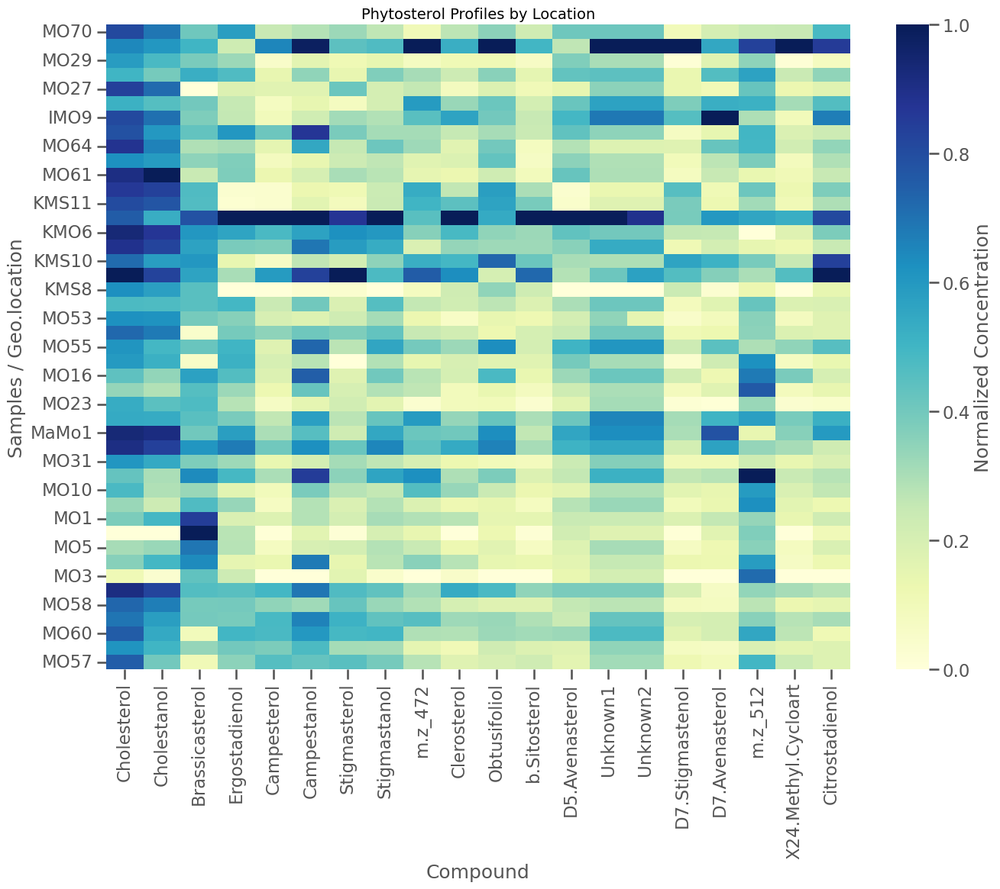

In [59]:
# Generate heatmaps for each chemical component block
plot_component_heatmap(fames, geo, "FAME Profiles by Location", "heatmap_fames")
plot_component_heatmap(tocopherols, geo, "Tocopherol Profiles by Location", "heatmap_tocopherols")
plot_component_heatmap(phytosterols, geo, "Phytosterol Profiles by Location", "heatmap_phytosterols")

In [12]:
def compute_regional_means(df, cols, compound_type, sort_by=None):
    """Computes and prints regional means for specified columns."""
    regional_means = df.groupby("Geo.location")[cols].mean()
    if sort_by and sort_by in regional_means.columns:
        regional_means = regional_means.sort_values(sort_by, ascending=False)
    print(f"\nRegional Means for {compound_type}:")
    display(regional_means.round(2))

In [13]:
def compute_regional_means(df, compound_cols, compound_type, sort_by=None):
    regional_means = df.groupby("Geo.location")[compound_cols].mean()
    if sort_by and sort_by in compound_cols:
        regional_means = regional_means.sort_values(by=sort_by, ascending=False)
    regional_means_rounded = regional_means.round(2)
    print(f"📊 Mean {compound_type} per Geo.location:\n", regional_means_rounded)

    # Save to Excel or CSV
    output_file = f"/content/drive/MyDrive/moringaseed_oil_location/figures/mean_{compound_type}.csv"
    regional_means_rounded.to_csv(output_file)
    print(f"✅ Table saved: {output_file}")


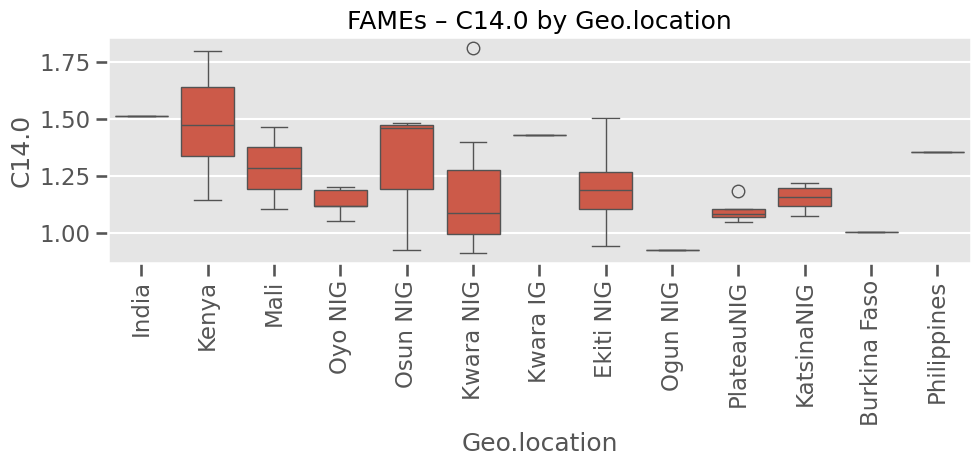

✅ Saved: C14.0_boxplot.png


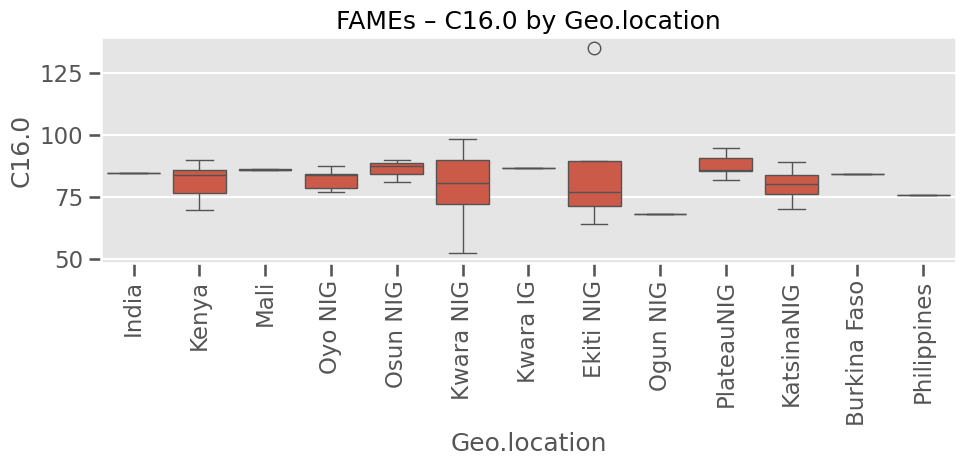

✅ Saved: C16.0_boxplot.png


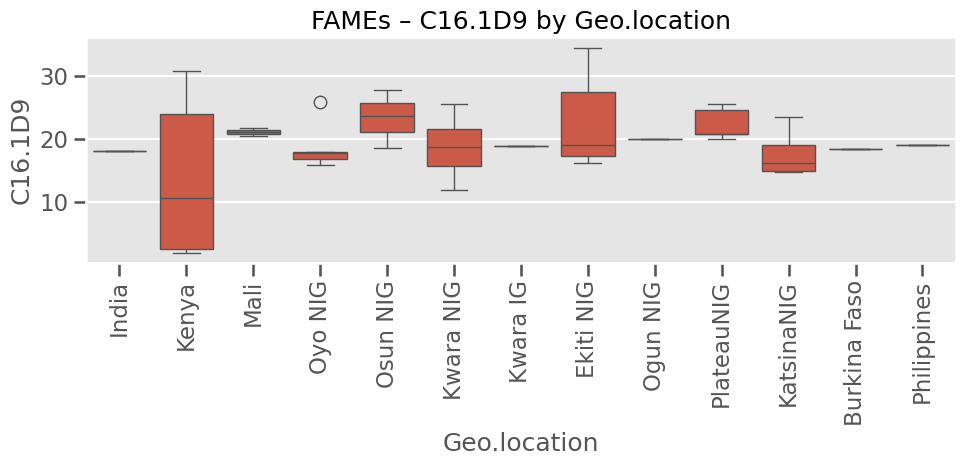

✅ Saved: C16.1D9_boxplot.png


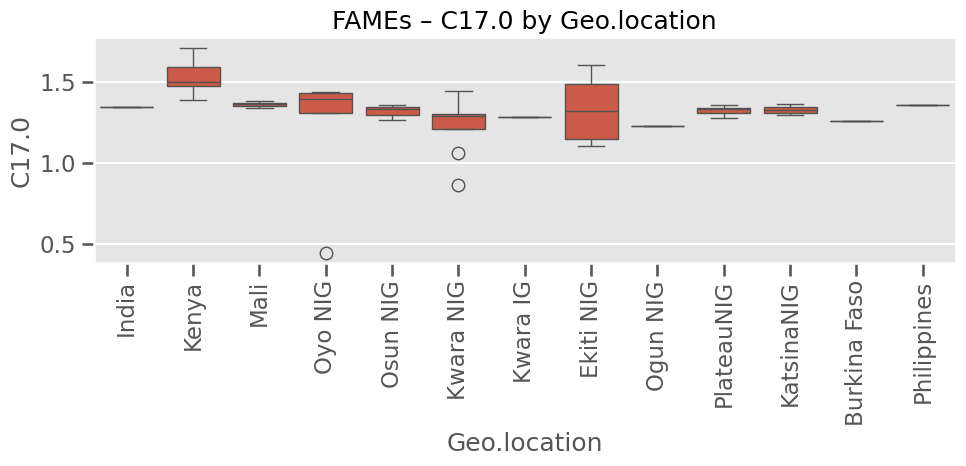

✅ Saved: C17.0_boxplot.png


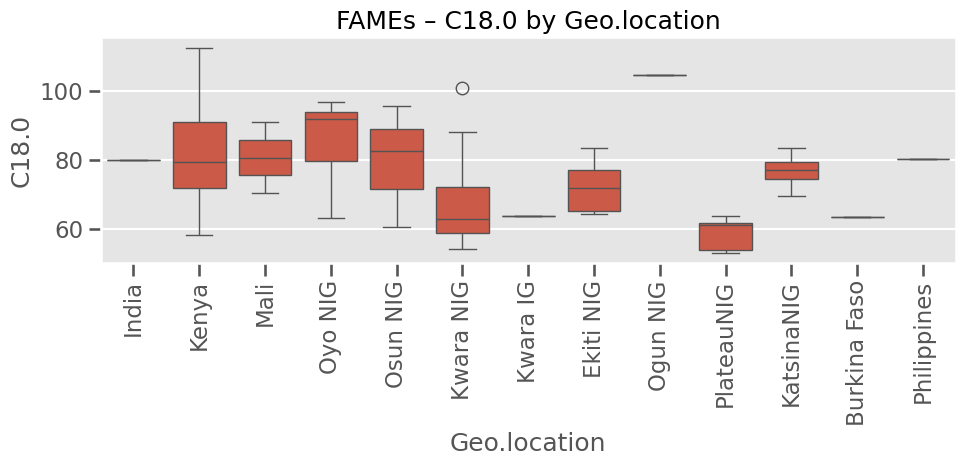

✅ Saved: C18.0_boxplot.png


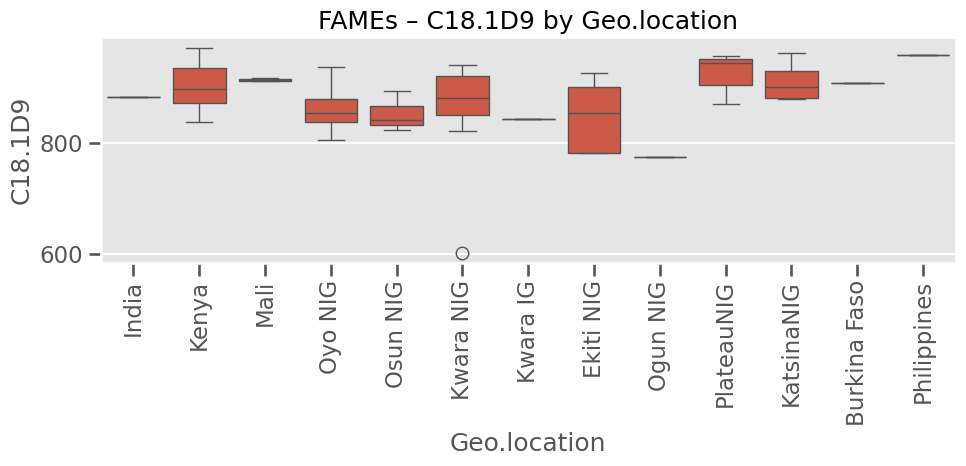

✅ Saved: C18.1D9_boxplot.png


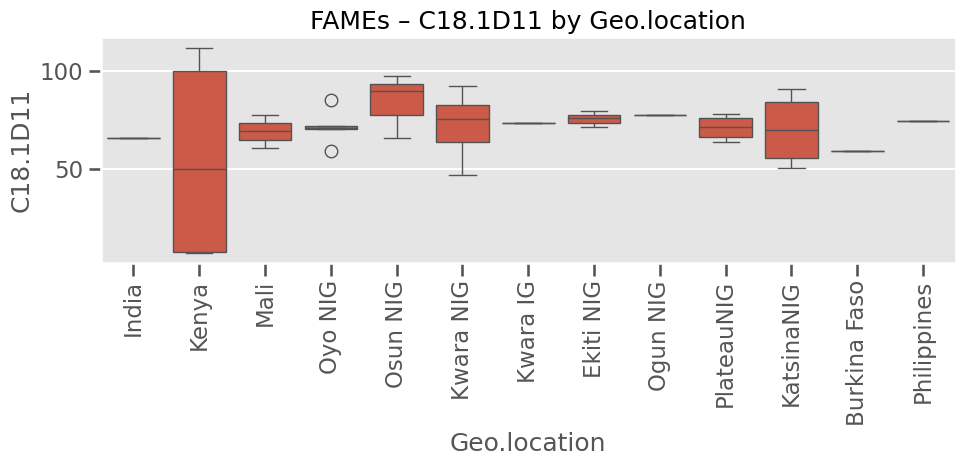

✅ Saved: C18.1D11_boxplot.png


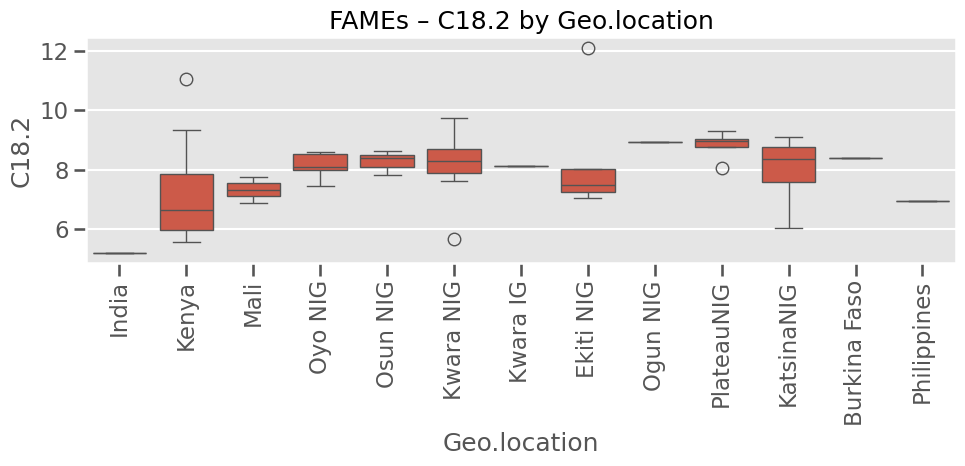

✅ Saved: C18.2_boxplot.png


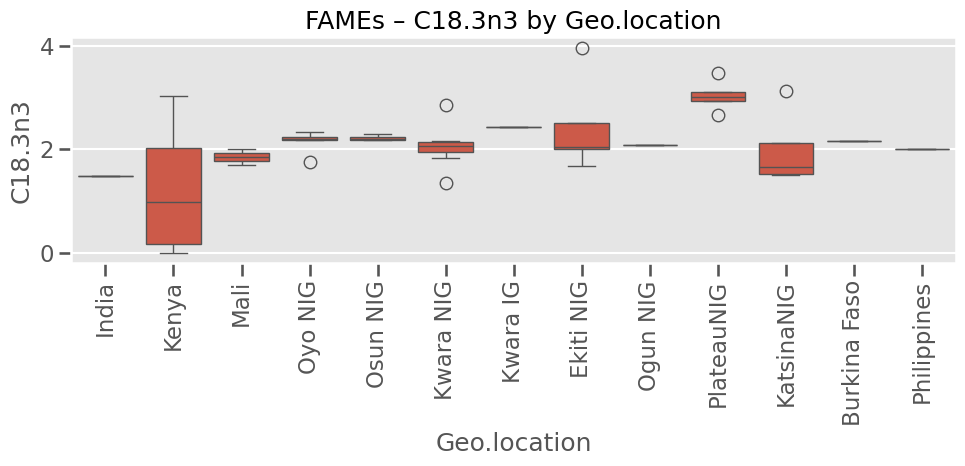

✅ Saved: C18.3n3_boxplot.png


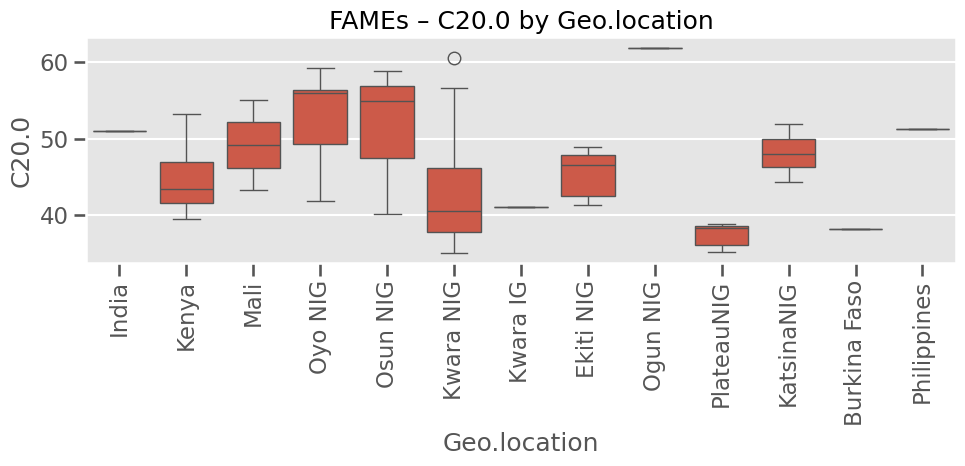

✅ Saved: C20.0_boxplot.png


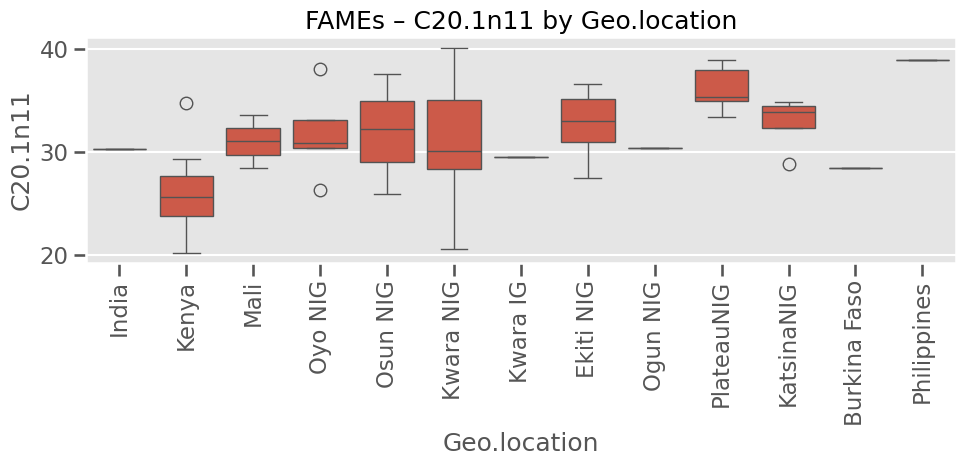

✅ Saved: C20.1n11_boxplot.png


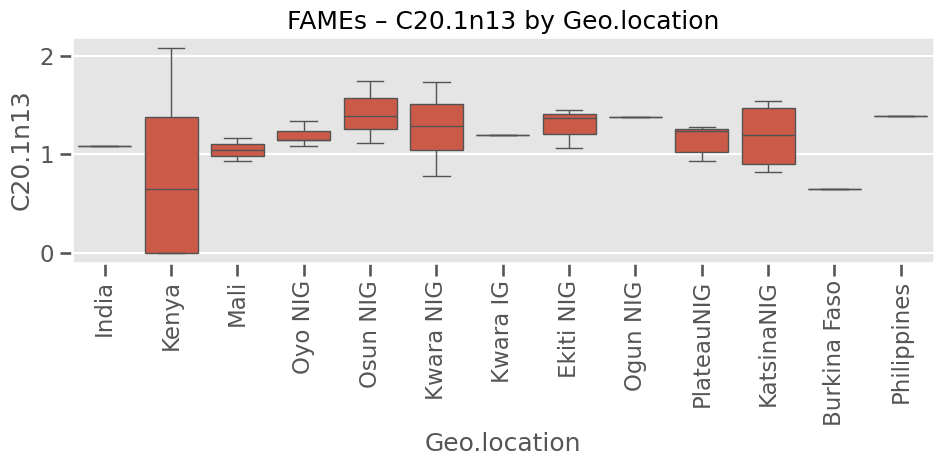

✅ Saved: C20.1n13_boxplot.png


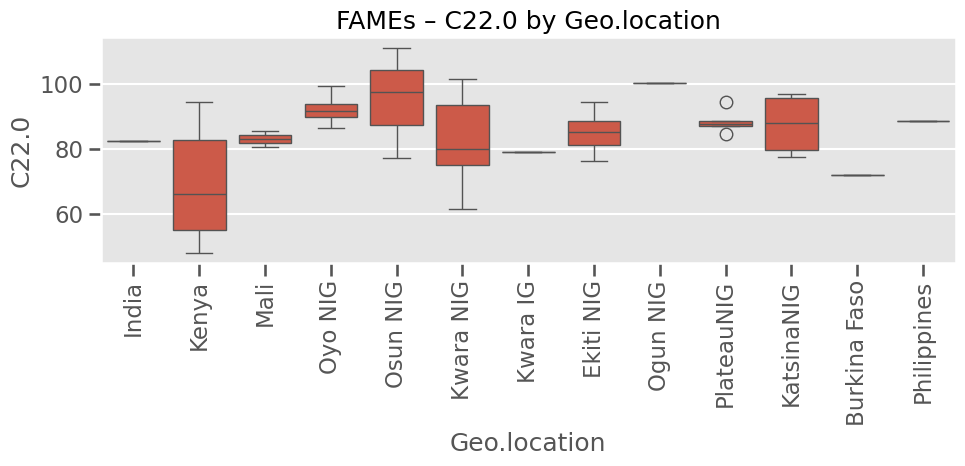

✅ Saved: C22.0_boxplot.png


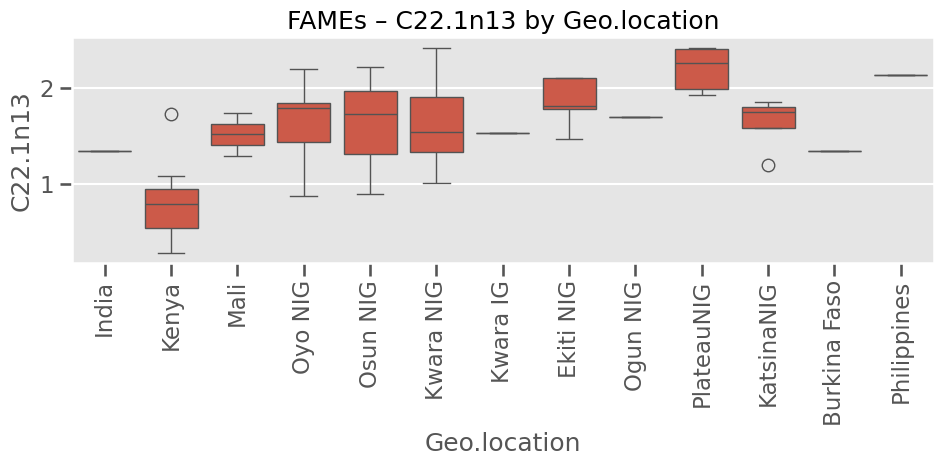

✅ Saved: C22.1n13_boxplot.png


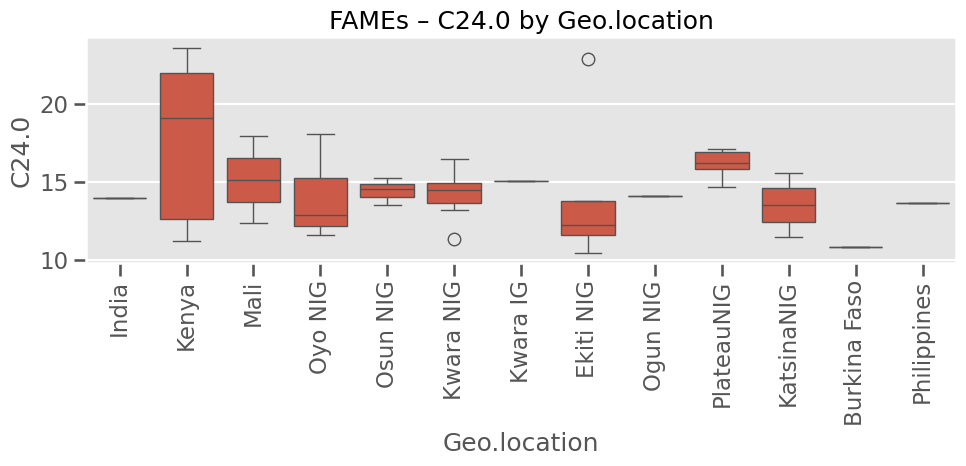

✅ Saved: C24.0_boxplot.png


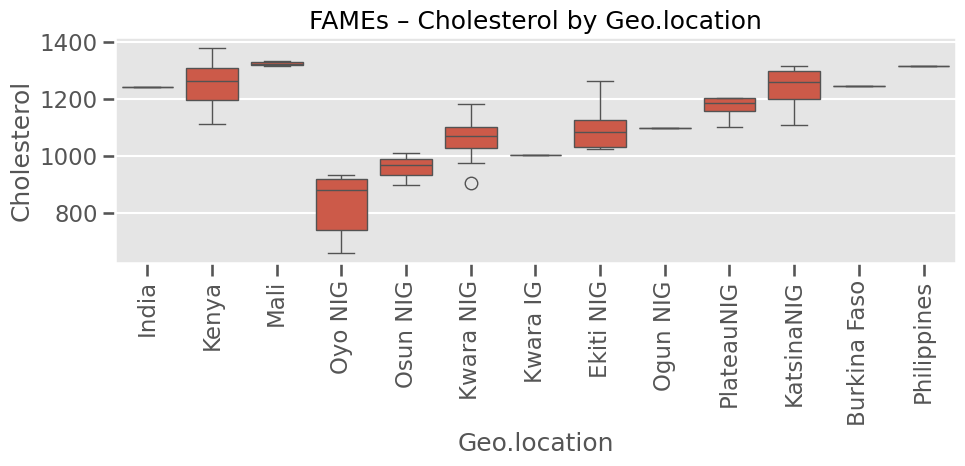

✅ Saved: Cholesterol_boxplot.png


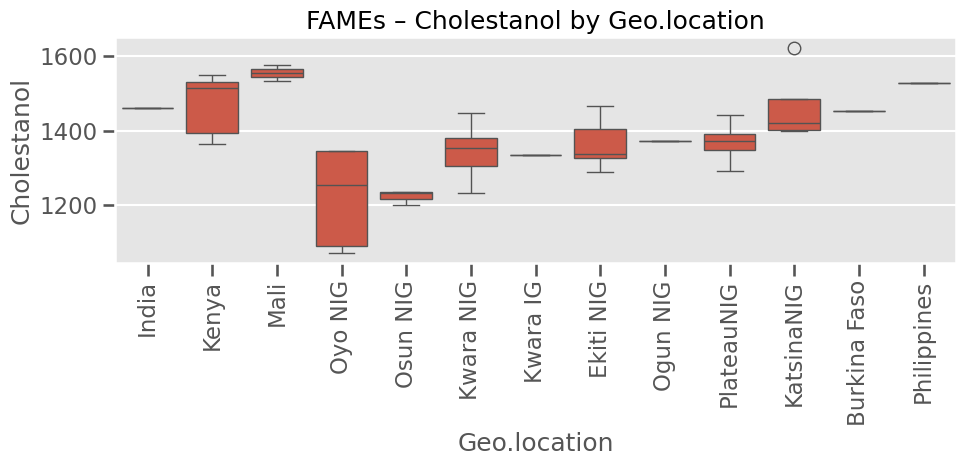

✅ Saved: Cholestanol_boxplot.png


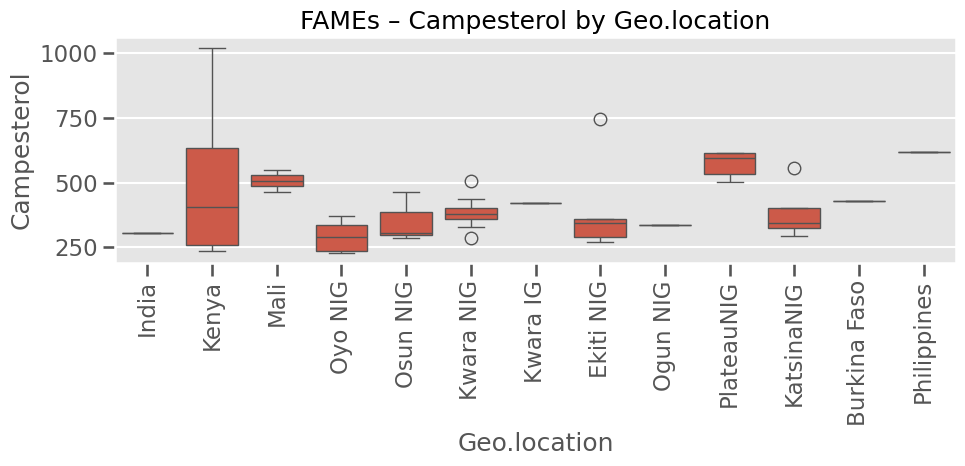

✅ Saved: Campesterol_boxplot.png


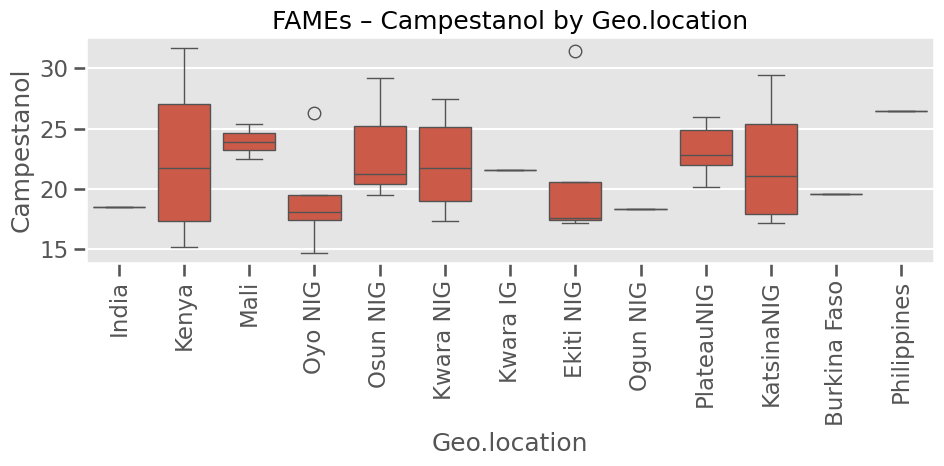

✅ Saved: Campestanol_boxplot.png


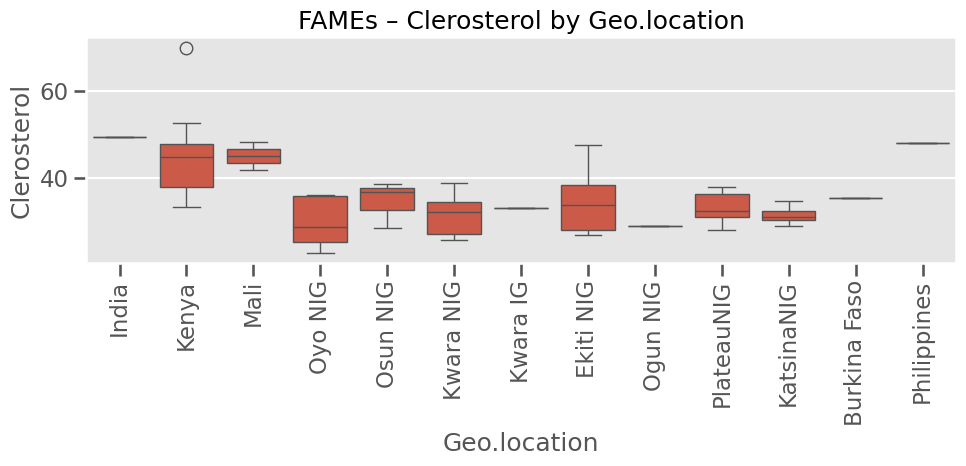

✅ Saved: Clerosterol_boxplot.png


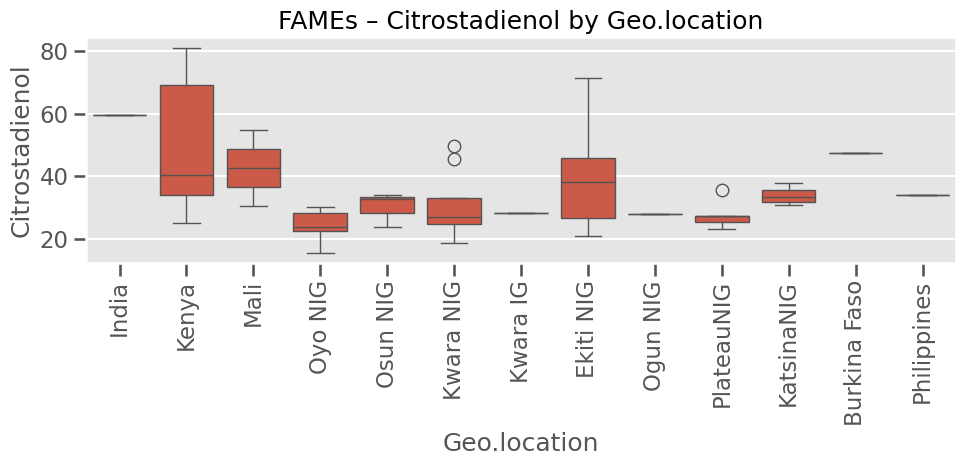

✅ Saved: Citrostadienol_boxplot.png


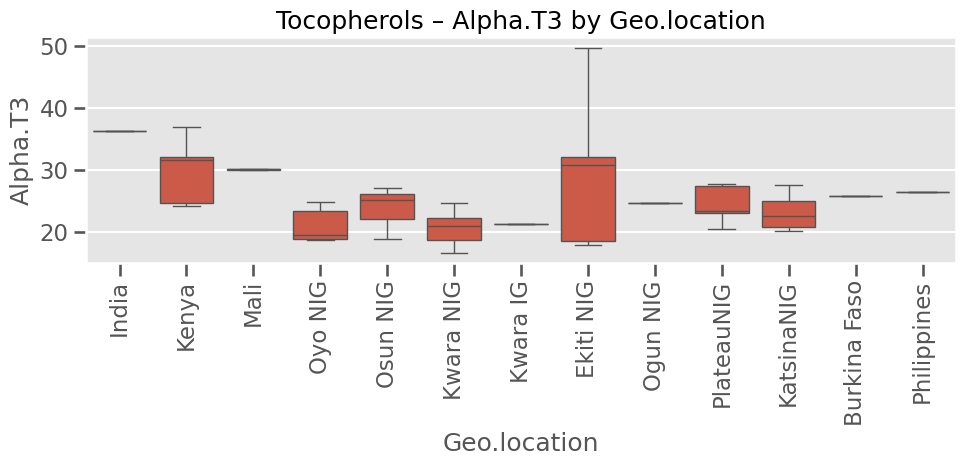

✅ Saved: Alpha.T3_boxplot.png


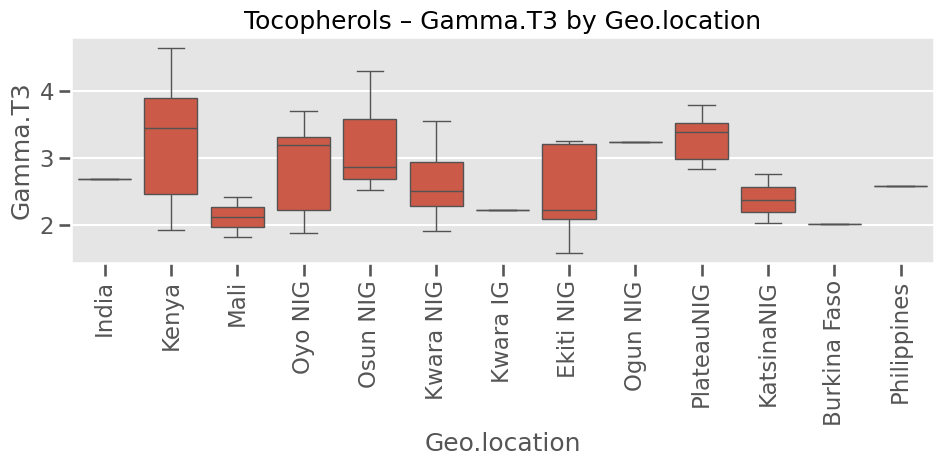

✅ Saved: Gamma.T3_boxplot.png


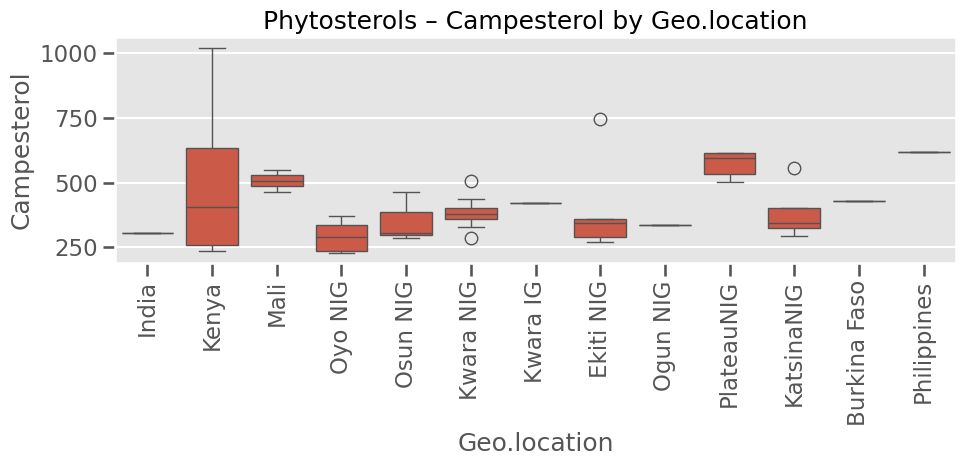

✅ Saved: Campesterol_boxplot.png


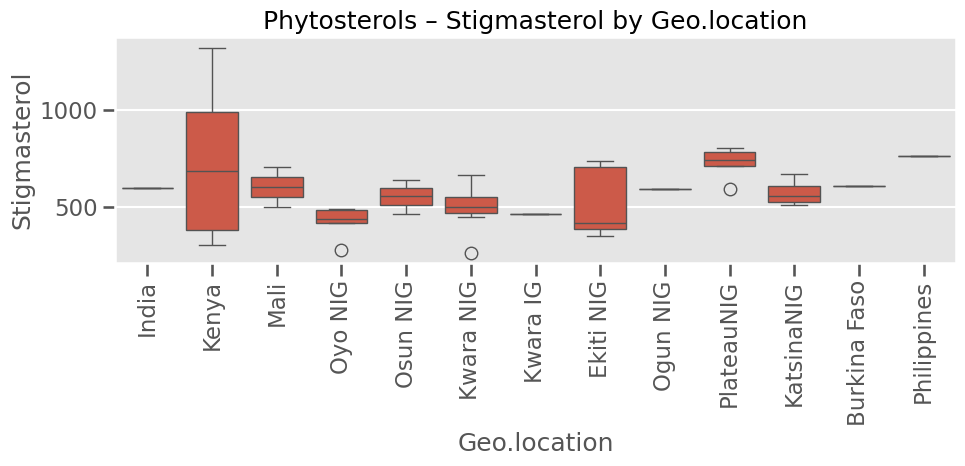

✅ Saved: Stigmasterol_boxplot.png


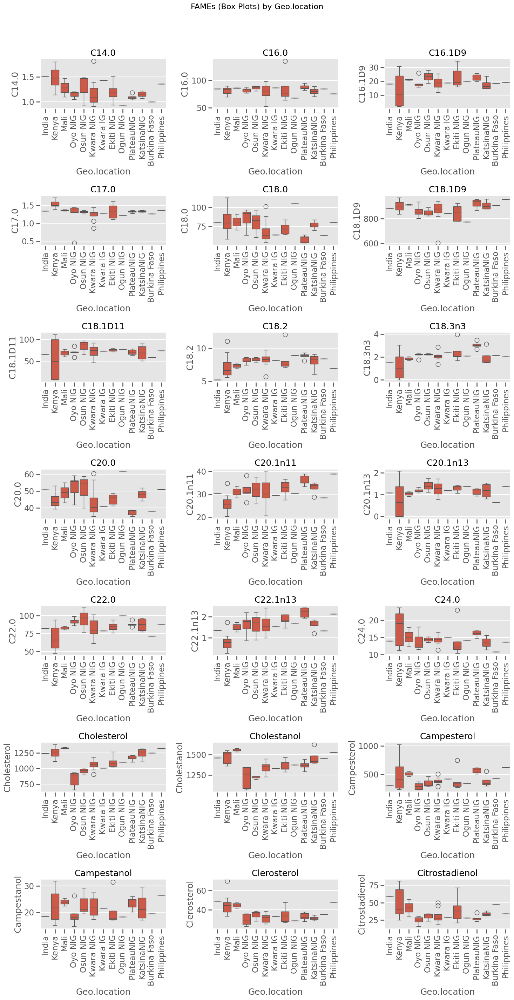

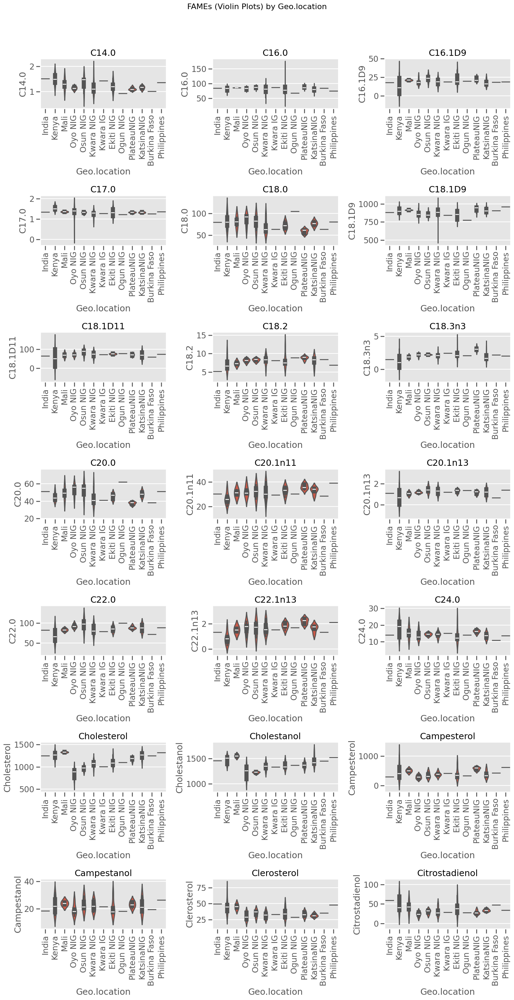

📊 Mean FAMEs per Geo.location:
               C14.0  C16.0  C16.1D9  C17.0   C18.0  C18.1D9  C18.1D11  C18.2  \
Geo.location                                                                   
PlateauNIG     1.10  87.80    22.31   1.32   58.83   925.21     70.94   8.83   
Ekiti NIG      1.20  87.63    22.86   1.33   72.47   848.47     75.61   8.39   
Kwara IG       1.43  86.64    18.88   1.29   63.84   843.96     73.15   8.14   
Osun NIG       1.29  86.24    23.33   1.32   79.65   852.42     84.21   8.28   
Mali           1.28  86.22    21.04   1.36   80.78   913.72     69.04   7.33   
India          1.51  84.81    18.13   1.35   80.09   882.26     65.76   5.22   
Burkina Faso   1.00  84.52    18.48   1.26   63.60   908.22     58.96   8.41   
Oyo NIG        1.14  82.36    18.84   1.20   85.15   862.61     71.42   8.14   
Kenya          1.49  81.62    13.46   1.54   81.81   902.04     54.51   7.29   
Kwara NIG      1.19  80.07    18.58   1.23   69.05   854.83     72.64   8.20   
KatsinaN

In [17]:
import math
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd
import numpy as np

# Recreate the merged dataframe from original data to ensure correct columns are available
dfs = [fames,tocopherols, phytosterols]
df = dfs[0]
for d in dfs[1:]:
    df = df.merge(d, on="Samples", how="inner")
df = df.merge(geo, on="Samples", how="left")   # adds Latitude, Longitude, GeoLocation

# Define plotting functions here to ensure they are available
def plot_individual_boxplots(df, compound_cols, compound_type):
    output_dir = f"/content/drive/MyDrive/moringaseed_oil_location/figures/{compound_type}"
    os.makedirs(output_dir, exist_ok=True)

    for col in compound_cols:
        plt.figure(figsize=(10, 5))
        sns.boxplot(data=df, x="Geo.location", y=col)
        plt.xticks(rotation=90)
        plt.title(f"{compound_type} – {col} by Geo.location")
        plt.tight_layout()
        plt.savefig(f"{output_dir}/{col}_boxplot.png", dpi=300)
        plt.show()
        plt.close()
        print(f"✅ Saved: {col}_boxplot.png")


def plot_grouped_violin_or_box(df, compound_cols, compound_type, plot_type="violin"):
    n = len(compound_cols)
    ncols = 3
    nrows = math.ceil(n / ncols)

    plt.figure(figsize=(5 * ncols, 4 * nrows))
    for i, col in enumerate(compound_cols, 1):
        plt.subplot(nrows, ncols, i)
        if plot_type == "violin":
            sns.violinplot(data=df, x="Geo.location", y=col, inner="box")
        else:
            sns.boxplot(data=df, x="Geo.location", y=col)
        plt.xticks(rotation=90)
        plt.title(f"{col}")

    plt.suptitle(f"{compound_type} ({plot_type.capitalize()} Plots) by Geo.location", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.savefig(f"/content/drive/MyDrive/moringaseed_oil_location/figures/{compound_type}_{plot_type}_grouped.png", dpi=300)
    plt.show()
    plt.close()


# Define chemical columns
FAMEs_cols = [col for col in df.columns if col.startswith("C")]
Tocopherol_cols = [col for col in df.columns if "Toc" in col or "T3" in col or "Tocopherol" in col]
Phytosterol_cols = [col for col in df.columns if col.lower() in ['campesterol', 'stigmasterol', 'β‑sitosterol', 'beta‑sitosterol', 'delta5‑avenasterol', 'others']]

# 1. Separate figures
plot_individual_boxplots(df, FAMEs_cols, "FAMEs")
plot_individual_boxplots(df, Tocopherol_cols, "Tocopherols")
plot_individual_boxplots(df, Phytosterol_cols, "Phytosterols")

# 2. Grouped violin or boxplots
plot_grouped_violin_or_box(df, FAMEs_cols, "FAMEs", plot_type="box")
plot_grouped_violin_or_box(df, FAMEs_cols, "FAMEs", plot_type="violin")

# 3. Regional mean tables
compute_regional_means(df, FAMEs_cols, "FAMEs", sort_by="C16.0")
compute_regional_means(df, Tocopherol_cols, "Tocopherols")
compute_regional_means(df, Phytosterol_cols, "Phytosterols")

In [27]:
def summarize_dataframe_columns(df, show_sample_values=True, n_samples=3):
    print(f"\n🔍 Data Summary: {df.shape[0]} rows × {df.shape[1]} columns\n")

    summary = []
    for col in df.columns:
        missing = df[col].isna().sum()
        missing_pct = (missing / len(df)) * 100
        unique_vals = df[col].nunique(dropna=True)
        sample_vals = df[col].dropna().unique()[:n_samples] if show_sample_values else []

        summary.append({
            "Column": col,
            "Missing (%)": f"{missing_pct:.1f}%",
            "Unique Values": unique_vals,
            "Example Values": sample_vals
        })

    summary_df = pd.DataFrame(summary)
    print(summary_df.to_string(index=False))
    return summary_df


In [28]:
summarize_dataframe_columns(df)



🔍 Data Summary: 45 rows × 47 columns

              Column Missing (%)  Unique Values                                         Example Values
             Samples        0.0%             45                                     [IMO9, KMO2, KMO4]
               C14.0        0.0%             40 [1.51333333333333, 1.14333333333333, 1.57666666666667]
               C16.0        0.0%             45            [84.8133333333333, 83.6766666666667, 73.86]
             C16.1D9        0.0%             45                       [18.1333333333333, 30.72, 18.74]
               C17.0        0.0%             40             [1.34666666666667, 1.49, 1.71333333333333]
               C18.0        0.0%             45 [80.0933333333333, 77.5933333333333, 63.6833333333333]
             C18.1D9        0.0%             45 [882.256666666667, 888.203333333333, 932.836666666667]
            C18.1D11        0.0%             45                      [65.7633333333333, 103.75, 92.17]
               C18.2        0.0%  

,Column,Missing (%),Unique Values,Example Values
0,Samples,0.0%,45,"[IMO9, KMO2, KMO4]"
1,C14.0,0.0%,40,"[1.51333333333333, 1.14333333333333, 1.5766666..."
2,C16.0,0.0%,45,"[84.8133333333333, 83.6766666666667, 73.86]"
3,C16.1D9,0.0%,45,"[18.1333333333333, 30.72, 18.74]"
4,C17.0,0.0%,40,"[1.34666666666667, 1.49, 1.71333333333333]"
5,C18.0,0.0%,45,"[80.0933333333333, 77.5933333333333, 63.683333..."
6,C18.1D9,0.0%,45,"[882.256666666667, 888.203333333333, 932.83666..."
7,C18.1D11,0.0%,45,"[65.7633333333333, 103.75, 92.17]"
8,C18.2,0.0%,44,"[5.21666666666667, 11.07, 7.34333333333333]"
9,C18.3n3,0.0%,43,"[1.49, 3.02333333333333, 2.41666666666667]"


In [29]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import numpy as np
import scipy.stats as stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm
from statsmodels.formula.api import ols
# from patsy import Q # Import Q - Removed direct import

# The simulated data creation has been removed to use the actual merged df
# geo_locations = ['Loc1', 'Loc2', 'Loc3', 'Loc4']
# sample_data = {
#     'Geo.location': np.random.choice(geo_locations, 100),
#     'C16.0': np.random.rand(100) * 10 + 30,
#     'C18.1': np.random.rand(100) * 10 + 40,
#     'Campesterol': np.random.rand(100) * 5 + 10,
#     'Alpha-T': np.random.rand(100) * 2 + 5
# }
# df = pd.DataFrame(sample_data)

# Define compound groups using actual column names from the merged dataframe
FAMEs_cols = [col for col in df.columns if col.startswith("C")]
# Tocopherol_cols = [col for col in df.columns if "Toc" in col or "T3" in col or "Tocopherol" in col]
Tocopherol_cols = [col for col in df.columns if col.lower() in ['alphat', 'alpha.t3', 'beta.t', 'gamma.t', 'gamma.t3', 'delta']]
Phytosterol_cols = [col for col in df.columns if col.lower() in ['campesterol', 'stigmasterol', 'β‑sitosterol', 'beta‑sitosterol', 'delta5‑avenasterol', 'others', 'cholesterol', 'cholestanol', 'brassicasterol', 'ergostadienol', 'stigmastanol', 'clerosterol', 'obtusifoliol','b.sitosterol', 'd5.avenasterol', 'X24.Methyl.Cycloart', 'Citrostadienol']]


# Create directory for figures (if not already created)
figure_dir = "/content/drive/MyDrive/moringaseed_oil_location/figures/" # Using the SAVE_DIR path structure
os.makedirs(figure_dir, exist_ok=True)

# --- Function to compute and plot regional means heatmap ---
# This function is already defined and used in other cells, removing from here to avoid redefinition
def plot_regional_means_heatmap(df, compound_cols, compound_type):
    heatmap_data = df.groupby("Geo.location")[compound_cols].mean()
    plt.figure(figsize=(10, len(heatmap_data) * 0.5 + 2))
    sns.heatmap(heatmap_data, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5, cbar_kws={'label': 'Mean Concentration'})
    plt.title(f"Regional Mean Heatmap: {compound_type}")
    plt.xlabel("Compounds")
    plt.ylabel("Geo.location")
    plt.tight_layout()
    filename = os.path.join(figure_dir, f"{compound_type}_regional_means_heatmap.png")
    plt.savefig(filename, dpi=300)
    plt.close()
    return filename
    plot_regional_means_heatmap(df, FAMEs_cols, "FAMEs")

# --- Function to run ANOVA and Tukey HSD ---
def run_anova_tukey(df, compound, group_col="Geo.location"):
    print(f"\n--- ANOVA + Tukey HSD for {compound} ---")
    # Check if the compound and group_col exist in the dataframe and have sufficient non-null data
    if compound in df.columns and group_col in df.columns and df[compound].notna().sum() > 0 and df[group_col].notna().sum() > 0:
        # Filter out rows with nulls in the relevant columns for the analysis
        analysis_df = df.dropna(subset=[compound, group_col]).copy()
        if len(analysis_df) > 1 and analysis_df[group_col].nunique() > 1:
             # Use Q() directly in the formula
            try:
                model = ols(f'Q("{compound}") ~ C(Q("{group_col}"))', data=analysis_df).fit()
                anova_table = sm.stats.anova_lm(model, typ=2)
                print(anova_table)

                # Tukey HSD - only run if ANOVA is significant (p < 0.05) and there is more than one group
                if anova_table['PR(>F)'].iloc[0] < 0.05:
                    print("\n--- Tukey HSD Post Hoc Test ---")
                    try:
                        tukey = pairwise_tukeyhsd(endog=analysis_df[compound], groups=analysis_df[group_col], alpha=0.05)
                        print(tukey.summary())
                    except ValueError as e:
                        print(f"Could not perform Tukey HSD: {e}. This might happen if a group has only one sample.")
                else:
                    print("\nANOVA not statistically significant, skipping Tukey HSD.")
            except Exception as e:
                 print(f"An error occurred during ANOVA or Tukey HSD: {e}")
        elif len(analysis_df) <= 1:
            print("Insufficient data points to perform ANOVA and Tukey HSD after dropping nulls.")
        else:
             print("Only one group found after dropping nulls, cannot perform ANOVA and Tukey HSD.")

    else:
        print(f"Compound '{compound}' or group column '{group_col}' not found in dataframe or contains only nulls.")


# --- Function to run t-test between two regions (if needed) ---
# This function is less relevant for analysis across multiple locations, keeping for reference but not using in the example executions
def run_t_test(df, compound, group1, group2, group_col="Geo.location"):
    print(f"\n--- T-test for {compound} between {group1} and {group2} ---")
    if compound in df.columns and group_col in df.columns:
        vals1 = df[df[group_col] == group1][compound].dropna()
        vals2 = df[df[group_col] == group2][compound].dropna()
        if len(vals1) > 1 and len(vals2) > 1:
            try:
                t_stat, p_val = stats.ttest_ind(vals1, vals2, equal_var=False)
                print(f"T-statistic: {t_stat:.4f}, p-value: {p_val:.4e}")
            except Exception as e:
                print(f"An error occurred during t-test: {e}")
        else:
            print("Insufficient data points in one or both groups to perform t-test after dropping nulls.")
    else:
         print(f"Compound '{compound}' or group column '{group_col}' not found in dataframe.")


# --- Function to run linear regression ---
def run_regression(df, compound, predictor="Latitude"):
    print(f"\n--- Regression: {compound} ~ {predictor} ---")
    if predictor in df.columns and compound in df.columns and df[compound].notna().sum() > 0 and df[predictor].notna().sum() > 0:
        # Filter out rows with nulls in the relevant columns for the analysis
        analysis_df = df.dropna(subset=[compound, predictor]).copy()
        if len(analysis_df) > 1:
            try:
                # Use Q() directly in the formula
                model = ols(f'Q("{compound}") ~ Q("{predictor}")', data=analysis_df).fit()
                print(model.summary())
            except Exception as e:
                print(f"An error occurred during regression: {e}")
        else:
            print("Insufficient data points to perform regression after dropping nulls.")

    else:
        print(f"Compound '{compound}' or predictor '{predictor}' not found in dataframe or contains only nulls.")





--- ANOVA + Tukey HSD for C16.0 ---
                           sum_sq    df        F    PR(>F)
C(Q("Geo.location"))   685.204312  12.0  0.32905  0.977815
Residual              5552.983332  32.0      NaN       NaN

ANOVA not statistically significant, skipping Tukey HSD.

--- ANOVA + Tukey HSD for AlphaT ---
                          sum_sq    df        F    PR(>F)
C(Q("Geo.location"))  665.507846  12.0  1.79215  0.092745
Residual              990.256095  32.0      NaN       NaN

ANOVA not statistically significant, skipping Tukey HSD.

--- ANOVA + Tukey HSD for Campesterol ---
                             sum_sq    df         F    PR(>F)
C(Q("Geo.location"))  338501.867690  12.0  1.083561  0.405323
Residual              833060.270161  32.0       NaN       NaN

ANOVA not statistically significant, skipping Tukey HSD.

--- Regression: C16.0 ~ Latitude ---
                            OLS Regression Results                            
Dep. Variable:             Q("C16.0")   R-squared:    

In [31]:
# Run ANOVA and Tukey HSD, and Regression for relevant compounds

# Define compound groups using actual column names from the merged dataframe
# (Including definitions here for robustness, though they are defined in qK5PEf8_acOu)
FAMEs_cols = [col for col in df.columns if col.startswith("C")]
Tocopherol_cols = [col for col in df.columns if col.lower() in ['alphat', 'alpha.t3', 'beta.t', 'gamma.t', 'gamma.t3', 'delta']]
Phytosterol_cols = [col for col in df.columns if col.lower() in ['campesterol', 'stigmasterol', 'β‑sitosterol', 'beta‑sitosterol', 'delta5‑avenasterol', 'others', 'cholesterol', 'cholestanol', 'brassicasterol', 'ergostadienol', 'stigmastanol', 'clerosterol', 'obtusifoliol','b.sitosterol', 'd5.avenasterol', 'X24.Methyl.Cycloart', 'Citrostadienol']]


# Run ANOVA and Tukey HSD for each FAME compound
for compound in FAMEs_cols:
    run_anova_tukey(df, compound, "Geo.location")

# Run ANOVA and Tukey HSD for each Tocopherol compound
for compound in Tocopherol_cols:
     run_anova_tukey(df, compound, "Geo.location")

# Run ANOVA and Tukey HSD for each Phytosterol compound
for compound in Phytosterol_cols:
    run_anova_tukey(df, compound, "Geo.location")


# Run regression for each FAME compound against Latitude
for compound in FAMEs_cols:
    run_regression(df, compound, "Latitude")

# Run regression for each Tocopherol compound against Latitude
for compound in Tocopherol_cols:
    run_regression(df, compound, "Latitude")

# Run regression for each Phytosterol compound against Latitude
for compound in Phytosterol_cols:
    run_regression(df, compound, "Latitude")

# The example executions of t-test were removed as ANOVA is more appropriate for multiple groups
# run_t_test(df, "C16.0", "Loc1", "Loc2")
# The incorrect t-test calls have been removed
# run_t_test(df, "C14.0", "C16.0", "C16.1D9", "C17.0", "C18.0","C18.1D9", "C18.1D11", "C18.2", "C18.3n3", "C20.0", "C20.1n13", "C22.0", "C22.1n13", "C24.0",  "Loc1", "Loc2","..")
# run_t_test(df, "AlphaT", "Alpha.t3", "Beta.T", "Gamma.T", "Gamma.T3", "Delta", "Loc1", "Loc2","..")
# run_t_test(df, "Cholesterol", "Cholestanol", "Brassiterol", "Ergaostadienol", "Campesterol", "Campestanol", "Stigmasterol", "β‑sitosterol", "beta‑sitosterol", "delta5‑avenasterol", "cholesterol", "cholestanol", "brassicasterol", "ergostadienol", "stigmastanol", "clerosterol", "obtusifoliol","b.Sitosterol", "d5.Avenasterol", "X24.Methyl.Cycloart", "Citrostadienol",  "Delta", "Loc1", "Loc2","..")


--- ANOVA + Tukey HSD for C14.0 ---
                        sum_sq    df         F    PR(>F)
C(Q("Geo.location"))  1.001669  12.0  1.839448  0.083516
Residual              1.452130  32.0       NaN       NaN

ANOVA not statistically significant, skipping Tukey HSD.

--- ANOVA + Tukey HSD for C16.0 ---
                           sum_sq    df        F    PR(>F)
C(Q("Geo.location"))   685.204312  12.0  0.32905  0.977815
Residual              5552.983332  32.0      NaN       NaN

ANOVA not statistically significant, skipping Tukey HSD.

--- ANOVA + Tukey HSD for C16.1D9 ---
                           sum_sq    df        F   PR(>F)
C(Q("Geo.location"))   449.451423  12.0  0.71985  0.72157
Residual              1664.982274  32.0      NaN      NaN

ANOVA not statistically significant, skipping Tukey HSD.

--- ANOVA + Tukey HSD for C17.0 ---
                        sum_sq    df         F    PR(>F)
C(Q("Geo.location"))  0.529865  12.0  1.133356  0.369313
Residual              1.246717  32.0    

✓ Saved: /content/drive/MyDrive/moringaseed_oil_location/figures/radar_top_fames.png


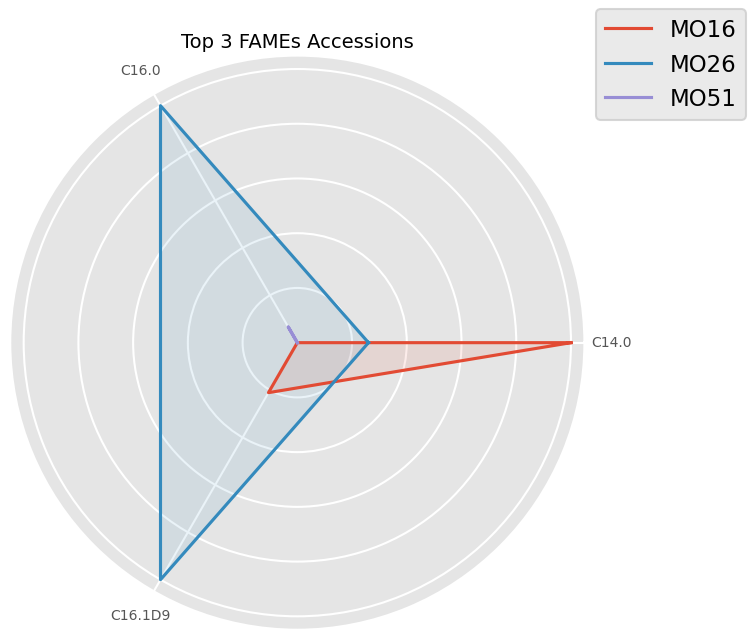

In [97]:
# Radar plot of top FAMEs accessions
radar_plot_top_fames(df_merged, headline_fa, "Top 3 FAMEs Accessions", "radar_top_fames")

In [104]:
# Define Phytosterol columns (needed for the radar plot)
Phytosterol_cols = [col for col in df_merged.columns if col.lower() in [ 'cholesterol', 'cholestanol', 'brassicasterol', 'ergostadienol', 'campesterol', 'campestanol', 'stigmasterol', 'stigmastanol', 'clerosterol', 'obtusifoliol','β‑sitosterol','b.sitosterol', 'd5.avenasterol', 'X24.Methyl.Cycloart', 'Citrostadienol']]